In [1]:
# description
import matplotlib.pyplot as plt
def show_img_np(img, max_h=3, max_w=20, save="", cmap='gray'):
    """
    :param np_array: input image, one channel or 3 channel,
    :param save: if save image
    :param size:
    :return:
    """
    if len(img.shape) < 3:
        plt.rcParams['image.cmap'] = cmap
    plt.figure(figsize=(max_w, max_h), facecolor='w', edgecolor='k')
    plt.imshow(img)
    if save:
        cv2.imwrite(save, img)
    else:
        plt.show()

# data explore
import cv2
from os.path import join, dirname, exists
from qwen2vl_worker import QwenVLWorker
import os 


data_root = "/home/agent_h/data/datasets/MathVision"
from datasets import load_dataset
qw = QwenVLWorker()




/home/agent_h/miniconda3/envs/r1vl/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.
Loading checkpoint shards: 100%|██████████████████████████████████████████████████████████████████████| 38/38 [00:32<00:00,  1.17it/s]
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


  0%|                                                                                                         | 0/304 [00:00<?, ?it/s]

/home/agent_h/data/datasets/MathVision/images/4.jpg

Role: You are a Vision-Language Model. Your goal is to provide a thorough and detailed description of the entire visual input I am giving you. This input can be an image, a document, a puzzle, an exam, a graph, or any other visual material. You must describe all observable details as accurately and exhaustively as possible.

	Instructions:
		1.	Overall Layout and Structure
	•	If the input is a document, note its format (e.g., text columns, paragraphs, headers, footers, margin notes, images embedded, etc.).
	•	If it is a graph or chart, mention the axes, labels, legends, data points, and any visible patterns.
	•	If it is an image or photo, describe the setting, background, objects, people, colors, and spatial relationships.
	2.	Text and Writing
	•	Transcribe all visible text, including titles, paragraphs, labels, numbers, footnotes, annotations, equations, or any handwritten content.
	•	Preserve the exact wording, spelling, capitaliza

/home/agent_h/miniconda3/envs/r1vl/lib/python3.12/site-packages/bitsandbytes/autograd/_functions.py:315: UserWarning: MatMul8bitLt: inputs will be cast from torch.bfloat16 to float16 during quantization
  warnings.warn(f"MatMul8bitLt: inputs will be cast from {A.dtype} to float16 during quantization")


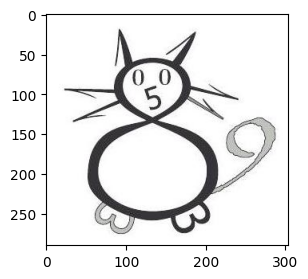

  0%|▎                                                                                            | 1/304 [03:18<16:42:09, 198.45s/it]

### Detailed Description of the Image

#### 1. **Overall Layout and Structure**
The image is a simple black-and-white illustration featuring a stylized cat. The composition is centered, with no additional background elements or distractions. The cat is the sole focus of the image, and its design is minimalistic yet expressive.

#### 2. **Text and Writing**
There is text incorporated into the cat's face. Specifically:
- Two "O" characters represent the cat's eyes.
- A "5" character represents the cat's mouth, giving the impression of a smile.

#### 3. **Visual Elements and Graphics**
- **Head and Face**: 
  - The cat's head is circular with two pointed ears extending upward from the top of the circle. The ears are triangular and slightly asymmetrical.
  - The facial features consist of the two "O" eyes and the "5" mouth, which together create a cheerful expression.
  - There are four whisker-like lines extending outward from the sides of the cat's face, two on each side. These lines are

In [ ]:
from tqdm import tqdm
dataset = load_dataset(data_root)
prompt = """
Role: You are a Vision-Language Model. Your goal is to provide a thorough and detailed description of the entire visual input I am giving you. This input can be an image, a document, a puzzle, an exam, a graph, or any other visual material. You must describe all observable details as accurately and exhaustively as possible.

	Instructions:
		1.	Overall Layout and Structure
	•	If the input is a document, note its format (e.g., text columns, paragraphs, headers, footers, margin notes, images embedded, etc.).
	•	If it is a graph or chart, mention the axes, labels, legends, data points, and any visible patterns.
	•	If it is an image or photo, describe the setting, background, objects, people, colors, and spatial relationships.
	2.	Text and Writing
	•	Transcribe all visible text, including titles, paragraphs, labels, numbers, footnotes, annotations, equations, or any handwritten content.
	•	Preserve the exact wording, spelling, capitalization, and punctuation.
	•	Mention any special formatting (e.g., bold, italics, underlined, highlighted).
	3.	Visual Elements and Graphics
	•	Describe shapes, lines, charts, diagrams, tables, images, icons, logos, and any relevant markings.
	•	Specify colors, approximate sizes, and relative positions (e.g., “A small red circle in the top-left corner of the page”).
	•	For puzzles or exams, list questions, diagrams, or figures in detail, including any references or numeric labels.
	4.	Context and Relationships
	•	For images with multiple elements, describe how they relate to each other (e.g., “The person on the left is holding a cup,” or “The bar graph has five columns labeled A through E”).
	•	If the scene implies an action or interaction, describe it factually (“A person is pouring liquid into a cup”).
	5.	Level of Detail
	•	Provide as much detail as possible—do not summarize or omit small details.
	•	If something is only partially visible, describe the visible portion.
	•	If there is uncertainty, you may note it explicitly (“It appears to be…”), but prioritize objective description over speculation.
	6.	No Interpretation Unless Requested
	•	Do not provide opinions, assumptions, or subjective interpretations.
	•	Focus on factual, objective observations about the visual input.

	Output:
		•	Present your description either as a structured list or a well-organized narrative.
	•	Make sure you include every piece of visible information (text, layout details, objects, colors, shapes, etc.).
	•	Aim to be comprehensive, clear, and unambiguous."""
for sample in tqdm(dataset['testmini']):
    image_path = join(data_root,sample["image"])
    
    content = qw.discribe_image(
        image_path,
        prompt = prompt)

    show_img_np(cv2.imread(image_path))
    print(content)

    
    # break

    

In [10]:
# r1 input
import matplotlib.pyplot as plt
def show_img_np(img, max_h=3, max_w=20, save="", cmap='gray'):
    """
    :param np_array: input image, one channel or 3 channel,
    :param save: if save image
    :param size:
    :return:
    """
    if len(img.shape) < 3:
        plt.rcParams['image.cmap'] = cmap
    plt.figure(figsize=(max_w, max_h), facecolor='w', edgecolor='k')
    plt.imshow(img)
    if save:
        cv2.imwrite(save, img)
    else:
        plt.show()


# data explore
import cv2
from os.path import join, dirname
import os 

data_root = "/home/agent_h/data/datasets/MathVision"
from datasets import load_dataset

from tqdm import tqdm
dataset = load_dataset(data_root)

request_messages = []
for sample in tqdm(dataset['testmini']):
    image_path = join(data_root,sample["image"])
    # show_img_np(cv2.imread(image_path))
    text_path = image_path.replace("/images/","/dsc2_qwen2_72bbb/").replace(".jpg",".txt")
    with open(text_path) as f:
        image_desc = f.read()
    question_text = sample['question'][:-8]
    if sample['options']:
        question_text += "Options: "
        question_text += str(sample['options'])

    content = f"""
            Solve the problem, the problem contains a image but instead of the image you are given a detailed description of the image, return only the final result in one word.

            ## problem

            {question_text}

            ## image description

            {image_desc}
            """
    # print(content)
    save_path = image_path.replace("/images/","/r1vl_0225_mini_2/").replace(".jpg",".json")
    request_messages.append((content,save_path))
    
    
    # break

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 304/304 [00:00<00:00, 627.13it/s]


In [13]:
print(request_messages[2])

("\n            Solve the problem, the problem contains a image but instead of the image you are given a detailed description of the image, return only the final result in one word.\n\n            ## problem\n\n            Misty the cat has five kittens: two of them are striped, one spotty, the rest of them are absolutely white. In which picture can we see the kittens of Misty, knowing that the ears of one of them are of different colour?\nOptions: ['A', 'B', 'C', 'D', 'E']\n\n            ## image description\n\n            The image consists of five groups of cartoon-style cats, labeled A through E. Each group contains a variety of cat designs, including different patterns and colors.\n\n**Group A:**\n- Contains six cats.\n- The cats have different patterns: one is striped, one is spotted, one is plain white, and others have various combinations of stripes and spots.\n- The cats are in different poses, some sitting and some standing.\n\n**Group B:**\n- Contains seven cats.\n- The cats

In [ ]:
import asyncio
from test_r1 import Generator
import os
from os.path import dirname

async def main():
    gen = Generator()
    tasks = []
    for message in request_messages:
        request_message = [
            {
                "role": "user",
                "content": message[0]
            }
        ]

        model_name = "deepseek-r1"

        # Create tasks for all calls
        os.makedirs(dirname(message[1]),exist_ok=True)
        asyncio.create_task(gen.request_llm(model_name, request_message, message[1]))
    

    # Wait for all tasks concurrently
    # responses = await asyncio.gather(tasks)
    # print("LLM Responses:", responses)

await main()

  0%|                                                                                                         | 0/304 [00:00<?, ?it/s]

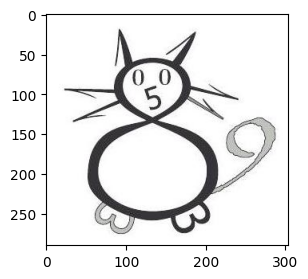

1
[] 6


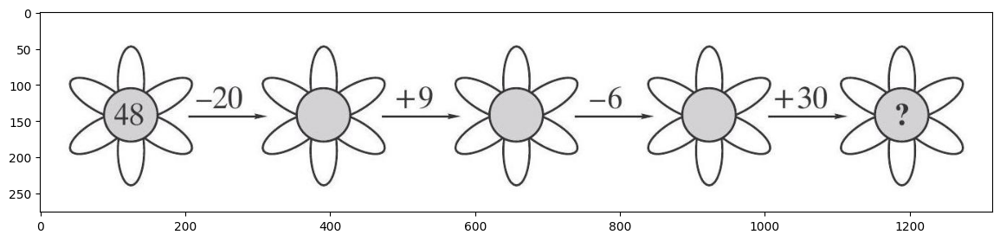

  1%|▋                                                                                                | 2/304 [00:00<00:25, 11.83it/s]

55
[] 61


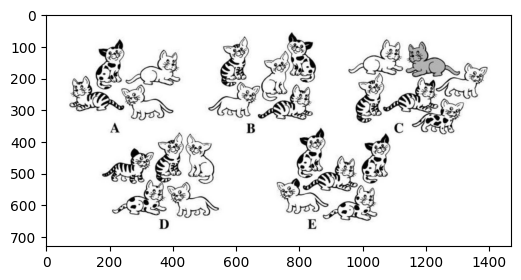

C
['A', 'B', 'C', 'D', 'E'] D


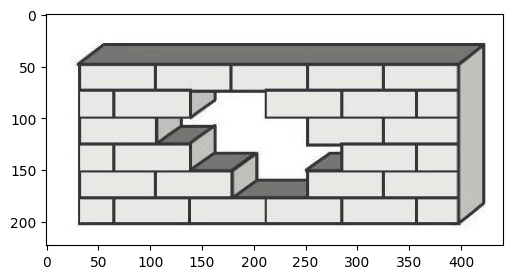

  1%|█▎                                                                                               | 4/304 [00:00<00:27, 10.96it/s]

10
[] 6


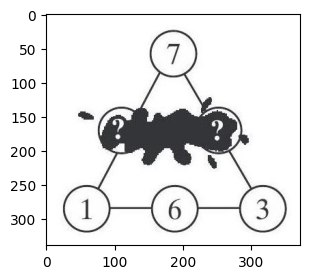

21
[] 2


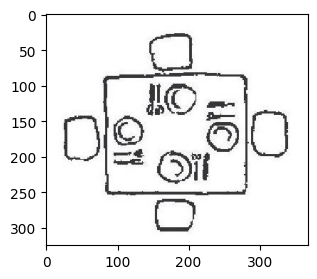

  2%|█▉                                                                                               | 6/304 [00:00<00:23, 12.92it/s]

10
[] 10


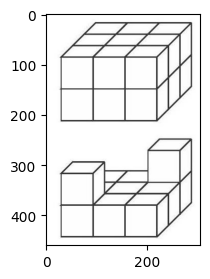

3
[] 7


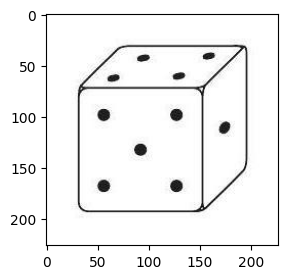

  3%|██▌                                                                                              | 8/304 [00:00<00:19, 14.89it/s]

11
[] 11


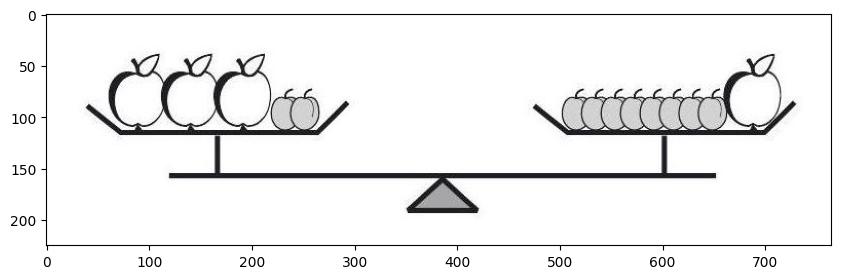

4.5
[] 3


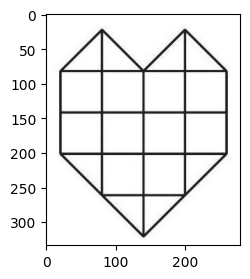

  3%|███▏                                                                                            | 10/304 [00:00<00:19, 14.81it/s]

96
[] 140


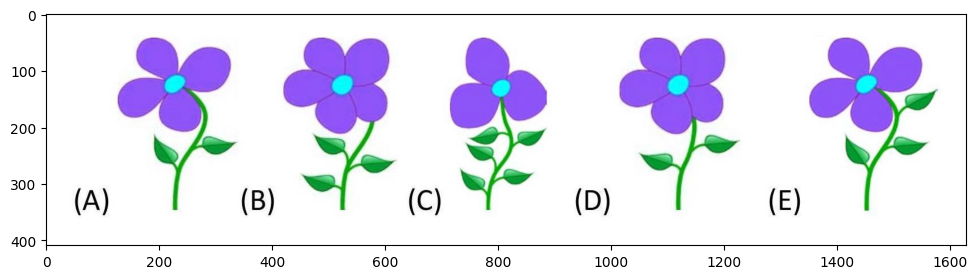

B
['A', 'B', 'C', 'D', 'E'] B


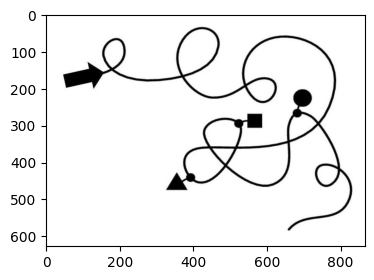

  4%|███▊                                                                                            | 12/304 [00:00<00:23, 12.68it/s]

$\Delta, \bullet, \square$
['$\\Delta, \\square, \\bullet$', '$\\Delta, \\bullet, \\square$', '$\\bullet, \\Delta, \\square$', '$\\square, \\Delta, \\bullet$', '$\\square, \\bullet, \\Delta$'] A


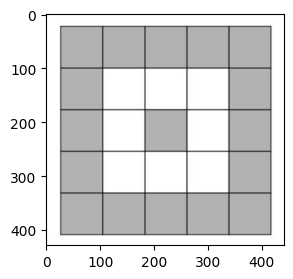

zero
[] 9


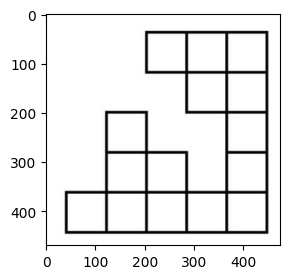

  5%|████▍                                                                                           | 14/304 [00:01<00:21, 13.78it/s]

9
[] 10


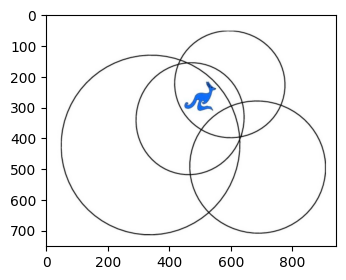

three
[] 3


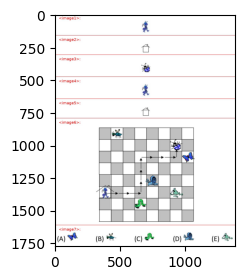

  5%|█████                                                                                           | 16/304 [00:01<00:25, 11.51it/s]

A
['A', 'B', 'C', 'D', 'E'] A


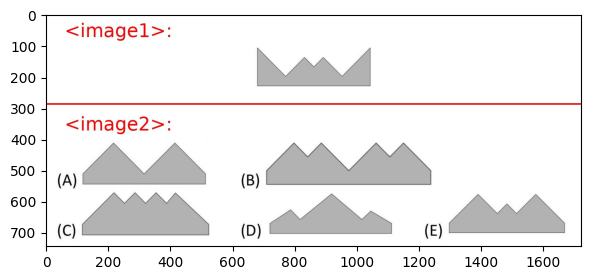

A
['A', 'B', 'C', 'D', 'E'] E


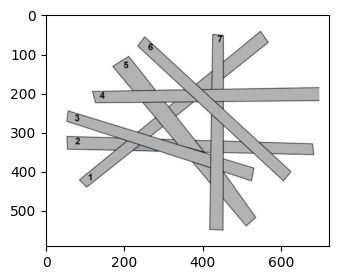

  6%|█████▋                                                                                          | 18/304 [00:01<00:25, 11.12it/s]

4
[] 3


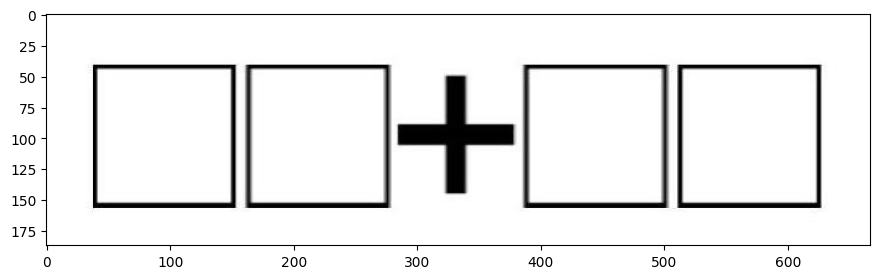

95
[] 95


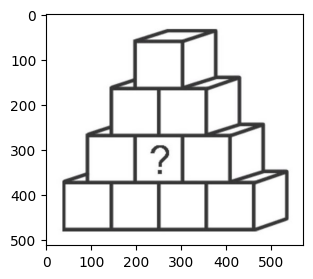

  7%|██████▎                                                                                         | 20/304 [00:01<00:23, 11.91it/s]

Yellow
['red', 'blue', 'green', 'Yellow', 'This cannot be worked out for certain.'] A


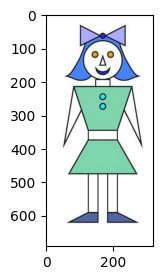

3
[] 5


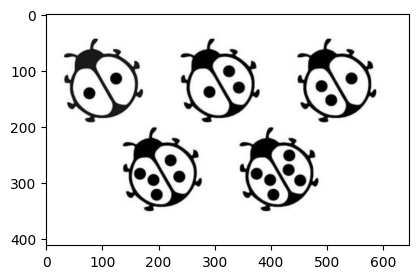

  7%|██████▉                                                                                         | 22/304 [00:01<00:21, 12.95it/s]

35
[] 19


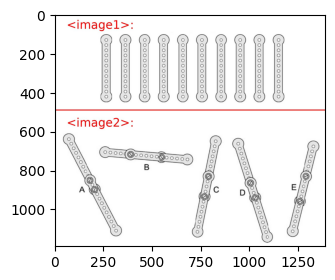

E
['A', 'B', 'C', 'D', 'E'] B


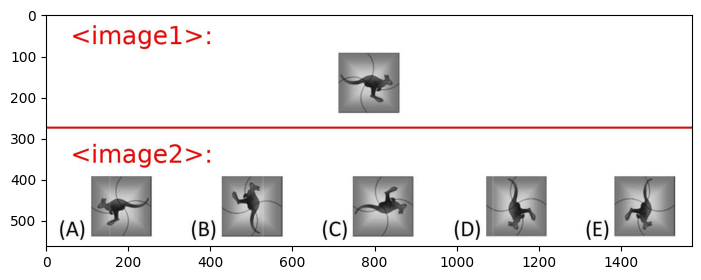

  8%|███████▌                                                                                        | 24/304 [00:01<00:24, 11.30it/s]

E
['A', 'B', 'C', 'D', 'E'] E


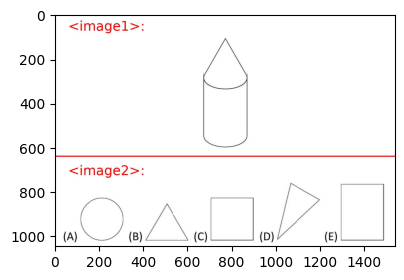

A
['A', 'B', 'C', 'D', 'E'] A


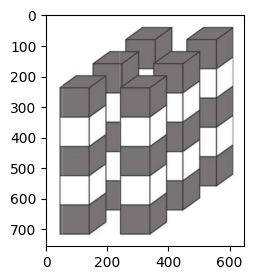

  9%|████████▏                                                                                       | 26/304 [00:02<00:25, 10.95it/s]

18
[] 12


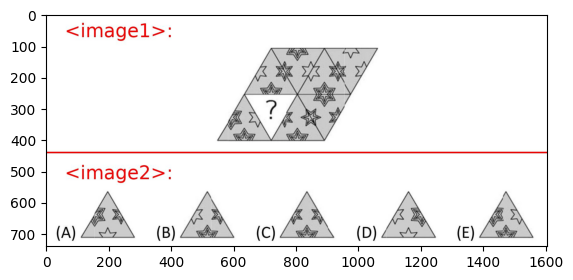

B
['A', 'B', 'C', 'D', 'E'] A


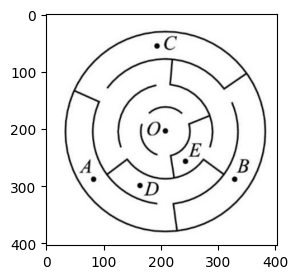

  9%|████████▊                                                                                       | 28/304 [00:02<00:25, 11.03it/s]

D
['A', 'B', 'C', 'D', 'E'] C


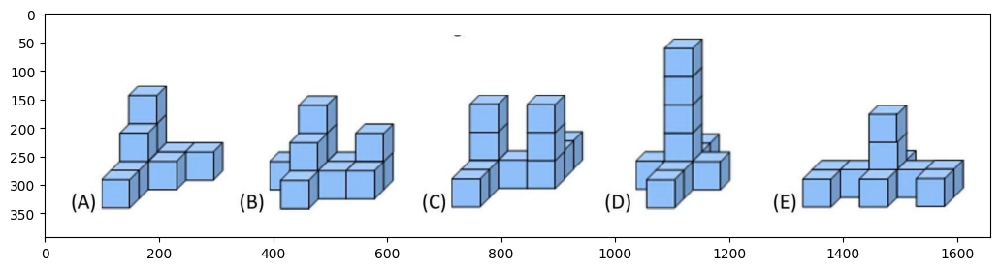

A
['A', 'B', 'C', 'D', 'E'] A


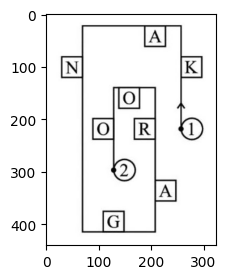

 10%|█████████▍                                                                                      | 30/304 [00:02<00:24, 11.19it/s]

AGRO
['KNAO', 'KNGO', 'KNR', 'AGRO', 'KAO'] A


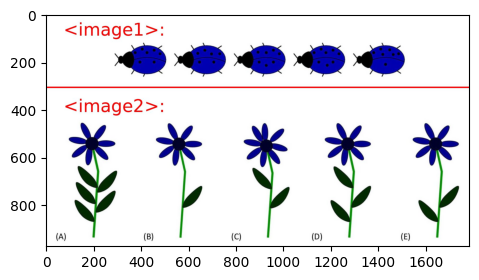

A
['A', 'B', 'C', 'D', 'E'] E


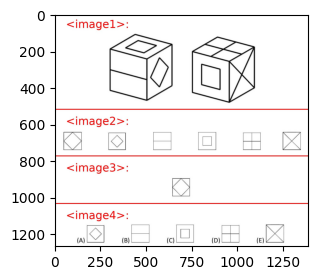

 11%|██████████                                                                                      | 32/304 [00:02<00:27,  9.76it/s]

B
[] C


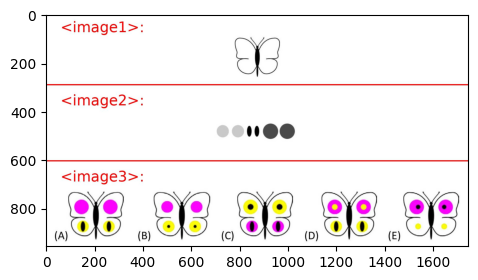

E
['A', 'B', 'C', 'D', 'E'] A


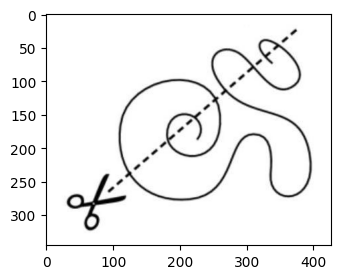

 11%|██████████▋                                                                                     | 34/304 [00:02<00:27,  9.92it/s]

4
[] 9


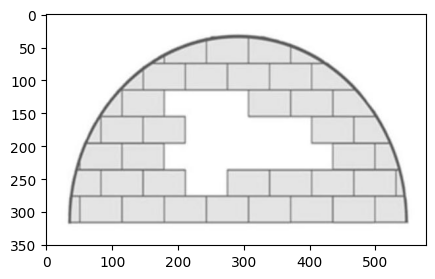

4
[] 10


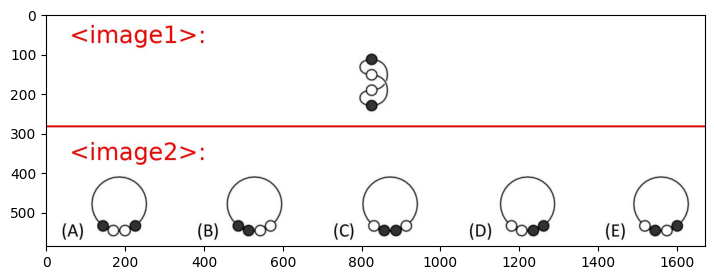

 12%|███████████▎                                                                                    | 36/304 [00:03<00:26, 10.26it/s]

A
['A', 'B', 'C', 'D', 'E'] E


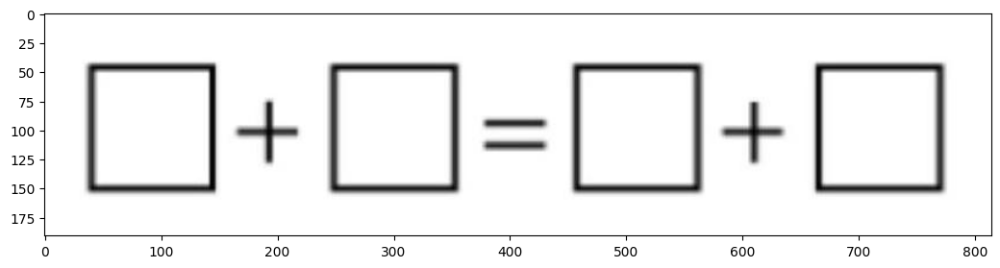

4
[] 4


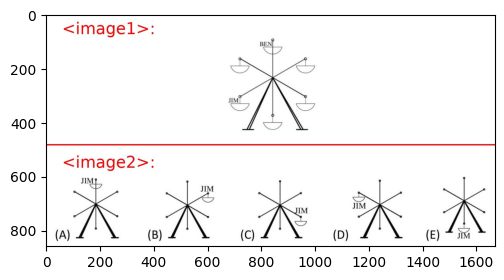

 12%|████████████                                                                                    | 38/304 [00:03<00:26, 10.10it/s]

C
['A', 'B', 'C', 'D', 'E'] C


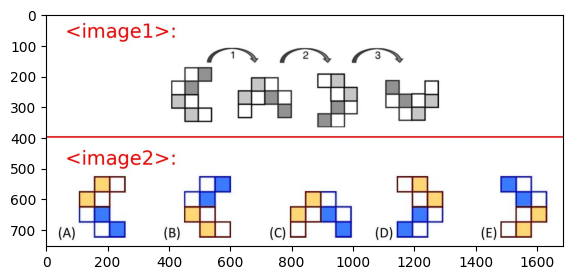

B
['A', 'B', 'C', 'D', 'E'] D


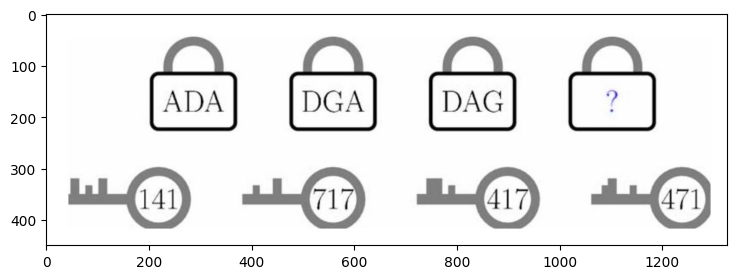

 13%|████████████▋                                                                                   | 40/304 [00:03<00:26,  9.81it/s]

GAD
['GDA', 'ADG', 'GAD', 'GAG', 'DAD'] D


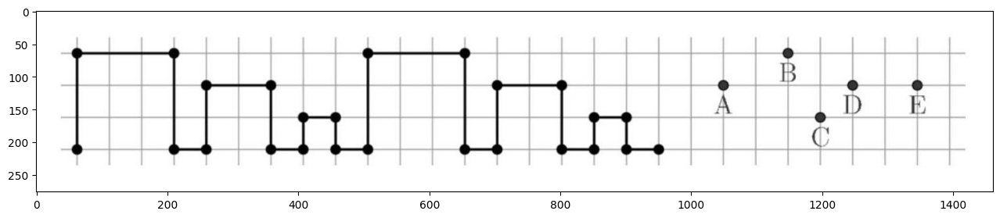

 13%|████████████▉                                                                                   | 41/304 [00:03<00:26,  9.76it/s]

A
['A', 'B', 'C', 'D', 'E'] D


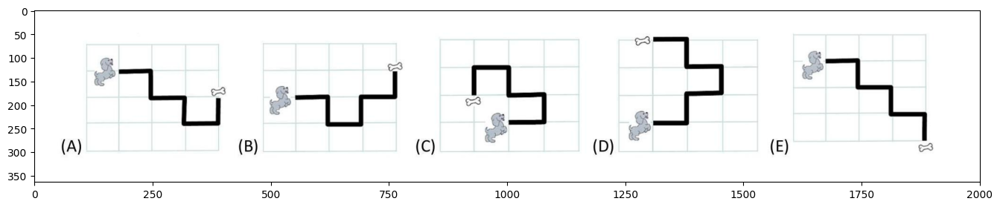

 14%|█████████████▎                                                                                  | 42/304 [00:03<00:27,  9.36it/s]

E
['A', 'B', 'C', 'D', 'E'] E


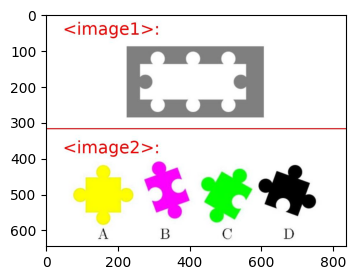

A
['A', 'B', 'C', 'D', 'C or D'] A


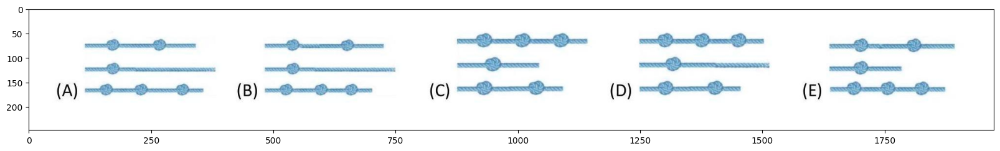

 14%|█████████████▉                                                                                  | 44/304 [00:04<00:27,  9.56it/s]

The problem states Charles creates three rope pieces with 1, 2, and 3 knots. The correct image should show these in any order. However, none of the options explicitly include a rope with 1 knot. Analyzing the descriptions:

- **Set (E)** has two ropes with 2 knots (one near each end) and one with 3 evenly spaced. While it lacks a 1-knot rope, the closest match in structure (distinct counts: 2,3,2) might be intended, possibly due to a description error. 

Answer: E
['A', 'B', 'C', 'D', 'E'] B


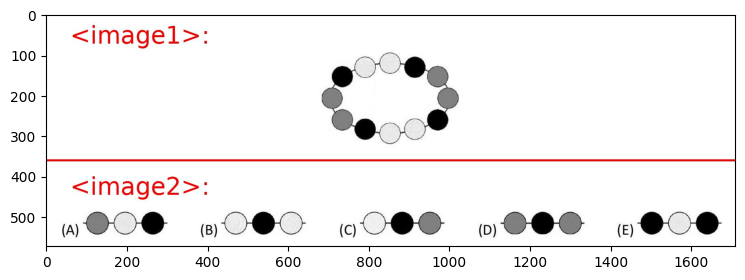

 15%|██████████████▏                                                                                 | 45/304 [00:04<00:40,  6.33it/s]

E
['A', 'B', 'C', 'D', 'E'] C


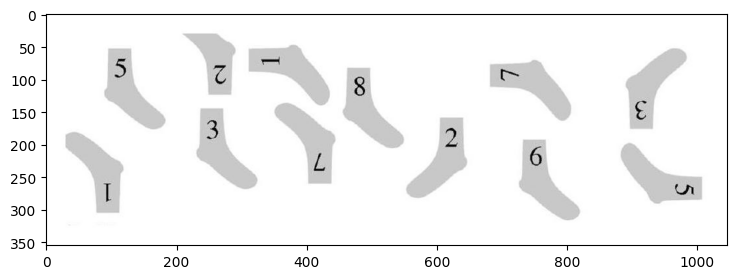

0
[] 5


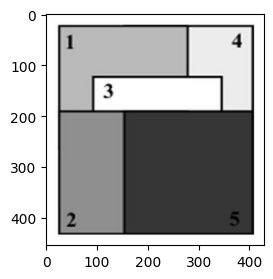

 15%|██████████████▊                                                                                 | 47/304 [00:04<00:32,  7.97it/s]

5-4-3-2-1
['5-4-3-2-1', '5-2-3-4-1', '5-4-2-3-1', '5-3-2-1-4', '5-2-3-1-4'] E


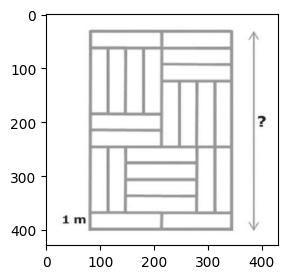

$8 \mathrm{~m}$  
**Answer:**  
\boxed{8}
['$6 \\mathrm{~m}$', '$8 \\mathrm{~m}$', '$10 \\mathrm{~m}$', '$11 \\mathrm{~m}$', '$12 \\mathrm{~m}$'] E


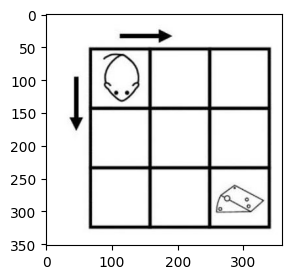

 16%|███████████████▍                                                                                | 49/304 [00:04<00:26,  9.80it/s]

6
[] 6


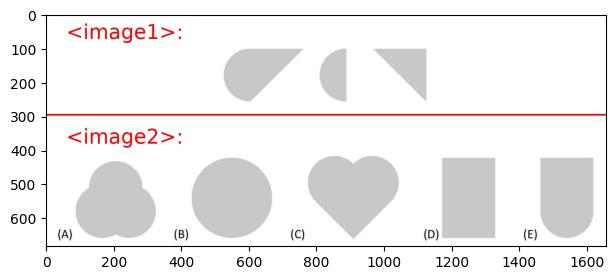

E
['A', 'B', 'C', 'D', 'E'] C


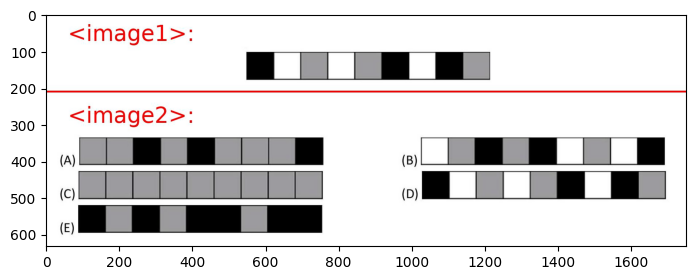

 17%|████████████████                                                                                | 51/304 [00:04<00:26,  9.39it/s]

E
['A', 'B', 'C', 'D', 'E'] A


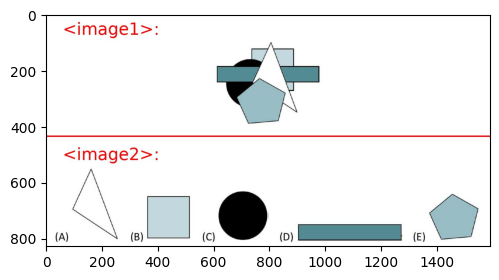

C
['A', 'B', 'C', 'D', 'E'] C


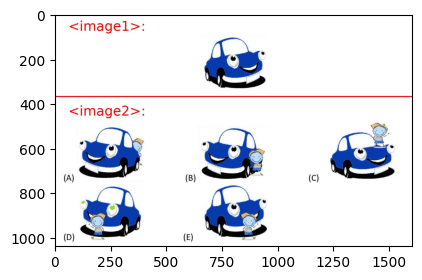

 17%|████████████████▋                                                                               | 53/304 [00:05<00:27,  8.97it/s]

D
['A', 'B', 'C', 'D', 'E'] E


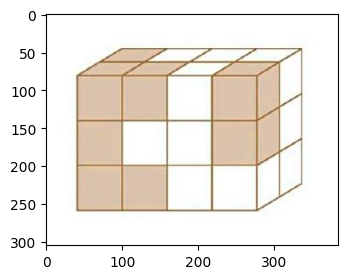

1
[] 2


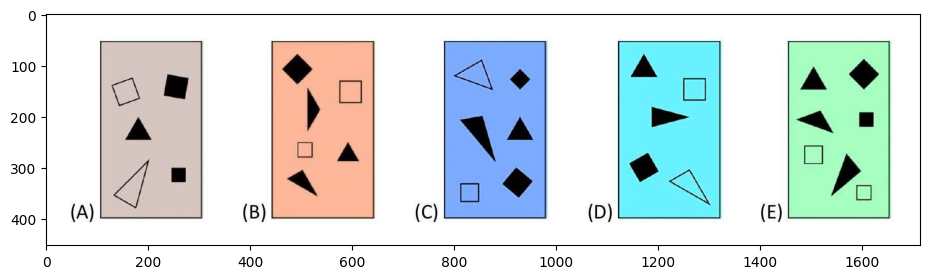

 18%|█████████████████▎                                                                              | 55/304 [00:05<00:26,  9.55it/s]

C
['A', 'B', 'C', 'D', 'E'] D


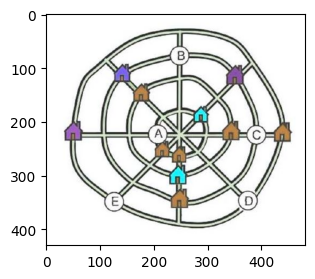

On B
['On A', 'On B', 'On C', 'On D', 'On E'] D


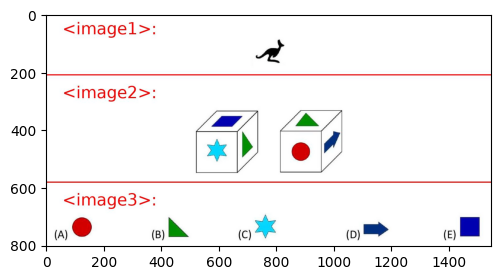

 19%|██████████████████                                                                              | 57/304 [00:05<00:24, 10.00it/s]

B
['A', 'B', 'C', 'D', 'E'] B


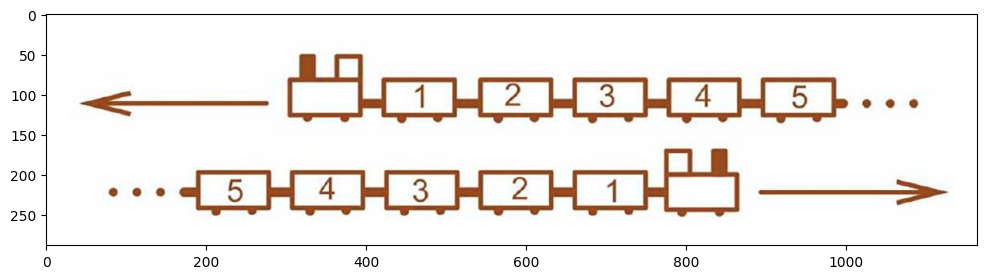

8
[] 8


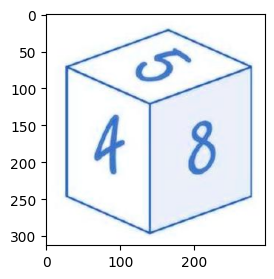

 19%|██████████████████▋                                                                             | 59/304 [00:05<00:23, 10.58it/s]

3
[] 3


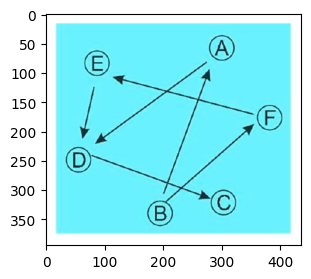

Person E

Answer: E
['Person A', 'Person B', 'Person C', 'Person D', 'Person E'] C


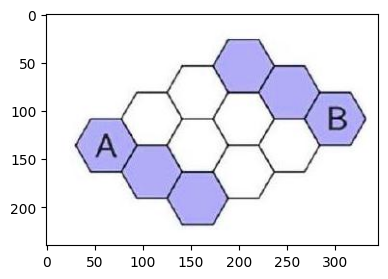

 20%|███████████████████▎                                                                            | 61/304 [00:05<00:20, 11.65it/s]

\boxed{220}
[] 16


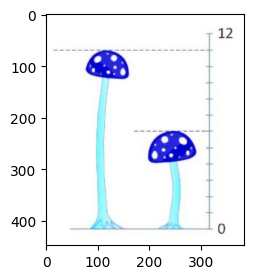

6
[] 5


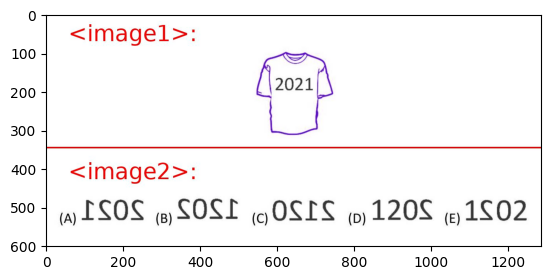

 21%|███████████████████▉                                                                            | 63/304 [00:05<00:19, 12.07it/s]

A
['A', 'B', 'C', 'D', 'E'] A


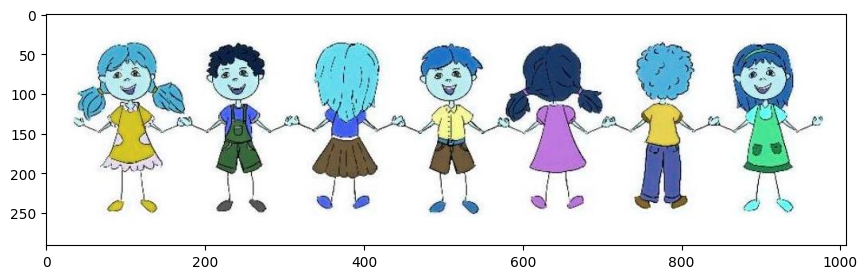

3
[] 6


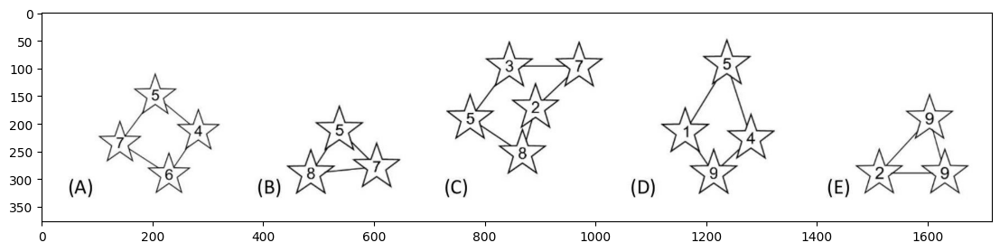

 21%|████████████████████▌                                                                           | 65/304 [00:06<00:21, 11.07it/s]

B
['A', 'B', 'C', 'D', 'E'] B


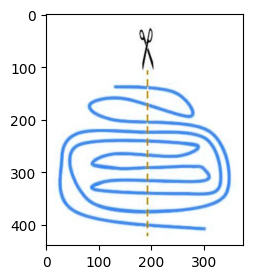

3
[] 12


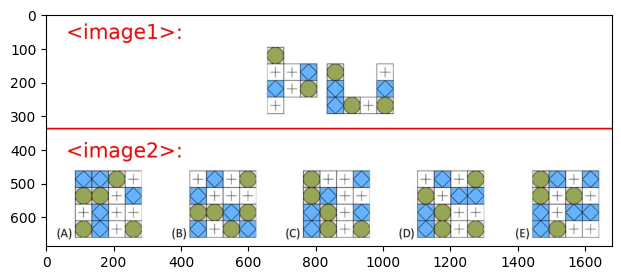

 22%|█████████████████████▏                                                                          | 67/304 [00:06<00:21, 11.00it/s]

C
['A', 'B', 'C', 'D', 'E'] A


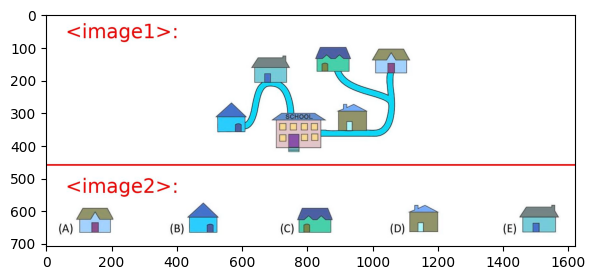

E
['A', 'B', 'C', 'D', 'E'] B


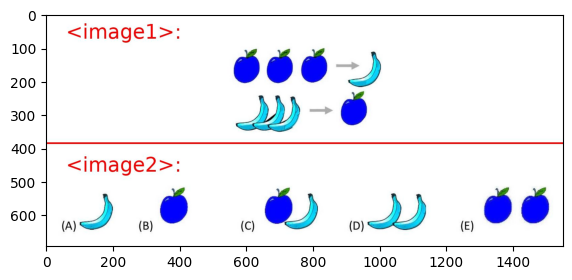

 23%|█████████████████████▊                                                                          | 69/304 [00:06<00:23, 10.18it/s]

A
['A', 'B', 'C', 'D', 'E'] A


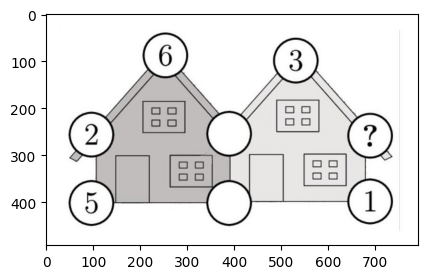

5
[] 9


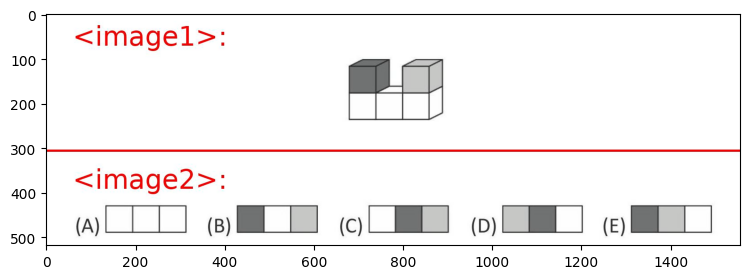

 23%|██████████████████████▍                                                                         | 71/304 [00:06<00:22, 10.48it/s]

C
['A', 'B', 'C', 'D', 'E'] B


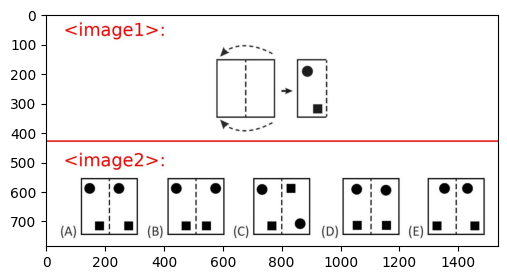

A
['A', 'B', 'C', 'D', 'E'] B


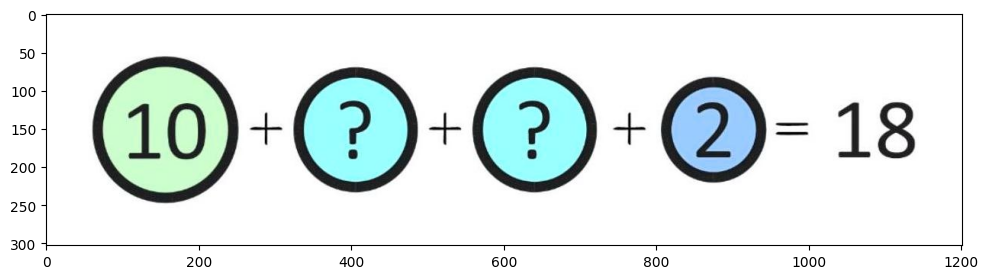

 24%|███████████████████████                                                                         | 73/304 [00:06<00:22, 10.13it/s]

3
[] 3


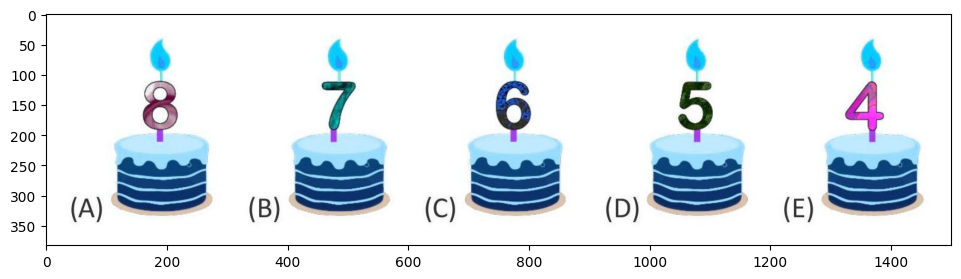

C
['A', 'B', 'C', 'D', 'E'] C


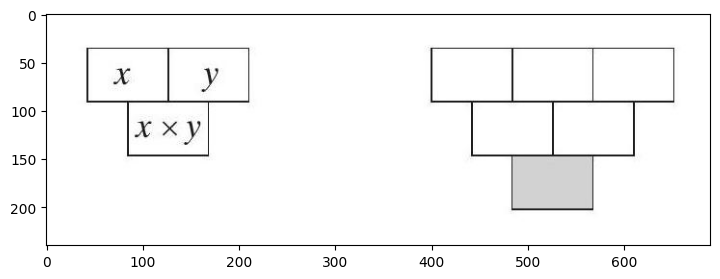

 25%|███████████████████████▋                                                                        | 75/304 [00:07<00:22, 10.32it/s]

154
['154', '100', '90', '88', '60'] A


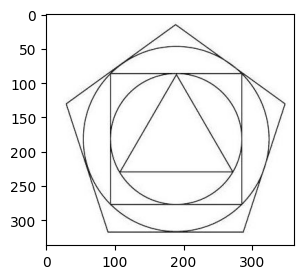

The problem involves sequentially adding polygons with an increasing number of sides (from 3 to 16), each circumscribed around a circle. Each new polygon (after the initial square) adds **2 disjoint regions** inside the final 16-sided polygon. Starting with 3 regions after the square, each subsequent polygon (12 total from pentagon to 16-gon) contributes 2 regions each. Thus, the total disjoint regions are **3 + (12 × 2) = 27**.

**Answer:**  
\boxed{27}
[] 248


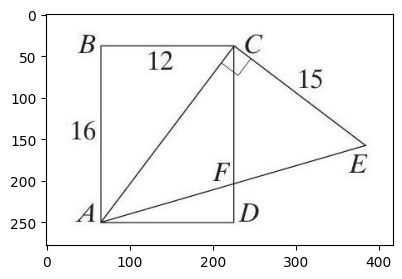

 25%|████████████████████████▎                                                                       | 77/304 [00:07<00:19, 11.67it/s]

The area of triangle \(ACF\) is \(\boxed{75}\).

**Final Answer**
\boxed{75}
[] 75


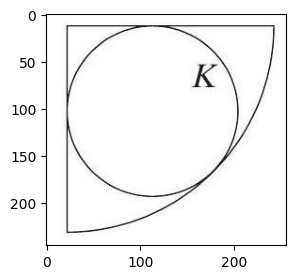

$\boxed{6(\sqrt{2}-1)}$
['$\\frac{6-\\sqrt{2}}{2}$', '$\\frac{3 \\sqrt{2}}{2}$', '2.5', '3', '$6(\\sqrt{2}-1)$'] E


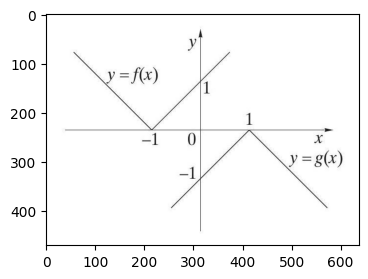

 26%|████████████████████████▉                                                                       | 79/304 [00:07<00:17, 12.92it/s]

f(x+2)=-g(x)
['$f(x)=-g(x)+2$', '$f(x)=-g(x)-2$', '$f(x)=-g(x+2)$', '$f(x+2)=-g(x)$', '$f(x+1)=-g(x-1)$'] C


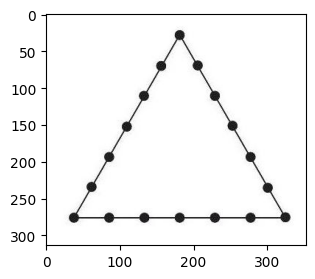

711
[] 711


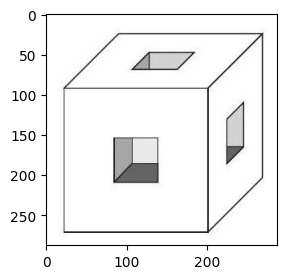

 27%|█████████████████████████▌                                                                      | 81/304 [00:07<00:15, 14.21it/s]

600 g
['$540 \\mathrm{~g}$', '$570 \\mathrm{~g}$', '$600 \\mathrm{~g}$', '$630 \\mathrm{~g}$', '$660 \\mathrm{~g}$'] C


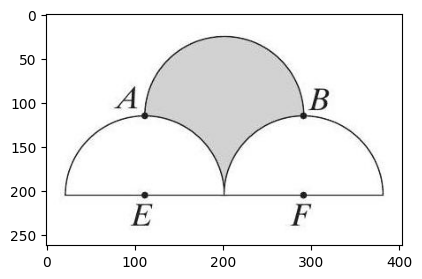

The problem involves three semicircles each with a radius of 2 cm. The shaded region is the largest semicircle, which is positioned above two smaller semicircles. The key steps are:

1. **Identify the radius and area of each semicircle**: All semicircles have a radius of 2 cm. The area of a semicircle is given by \(\frac{1}{2} \pi r^2\).
2. **Calculate the area of the shaded semicircle**: The largest semicircle (shaded) has a radius of 2 cm, so its area is \(\frac{1}{2} \pi (2)^2 = 2\pi \, \text{cm}^2\).

The shaded region is solely the area of the largest semicircle, and no overlapping areas need to be subtracted since the semicircles are tangent and do not overlap.

\(\boxed{2\pi}\)
[] 8


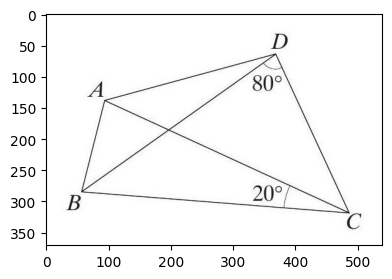

 27%|██████████████████████████▏                                                                     | 83/304 [00:07<00:15, 14.59it/s]

The final result is $\boxed{120^{\circ}}$. 

**Step-by-Step Explanation:**

1. **Triangle ABC Properties**:
   - Given \( AC = BC \), triangle \( ABC \) is isosceles with \( \angle ACB = 20^\circ \).
   - Calculate angles at A and B: \( \angle BAC = \angle ABC = \frac{180^\circ - 20^\circ}{2} = 80^\circ \).

2. **Angle Bisector BD**:
   - BD bisects \( \angle ABC \) (80°), so \( \angle ABD = \angle CBD = 40^\circ \).

3. **Triangle BDC Analysis**:
   - Given \( \angle BDC = 80^\circ \), use angle sum property:
     \[
     \angle BCD = 180^\circ - 80^\circ - 40^\circ = 60^\circ.
     \]

4. **Coordinate System Setup**:
   - Place \( C \) at origin (0,0), \( B \) at (1,0), and \( A \) at \( (\cos20^\circ, \sin20^\circ) \).

5. **Locating Point D**:
   - Use Law of Sines in \( \triangle BDC \):
     \[
     BD = \frac{\sin60^\circ}{\sin80^\circ} \approx 0.8794, \quad CD = \frac{\sin40^\circ}{\sin80^\circ} \approx 0.6523.
     \]
   - Coordinates of D derived as \( (0.326, 0.565) \).

6. 

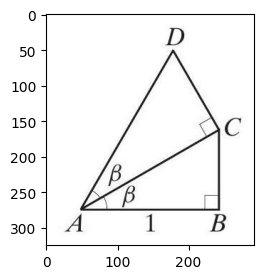

$\boxed{\dfrac{1}{\cos^2 \beta}}$
['$\\cos \\beta+\\tg \\beta$', '$\\frac{1}{\\cos (2 \\beta)}$', '$\\cos ^{2} \\beta$', '$\\cos (2 \\beta)$', '$\\frac{1}{\\cos ^{2} \\beta}$'] E


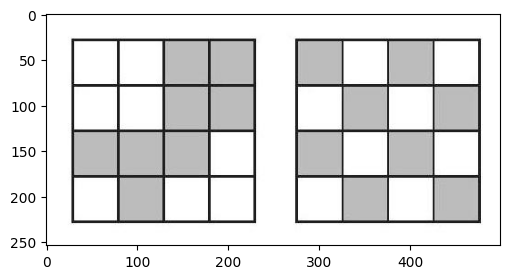

 28%|██████████████████████████▊                                                                     | 85/304 [00:07<00:14, 15.32it/s]

6
[] 4


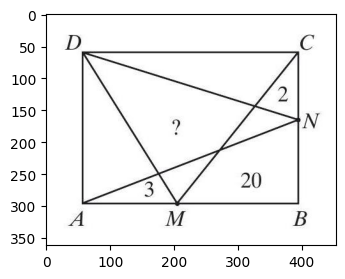

30
[] 25


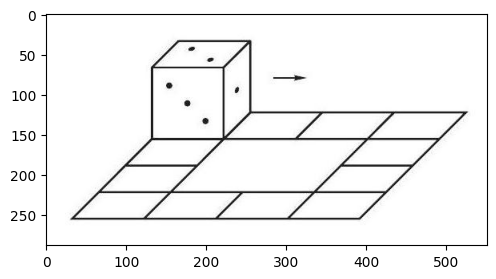

 29%|███████████████████████████▍                                                                    | 87/304 [00:07<00:14, 15.35it/s]

The die must complete the path twice for it to return to its initial position and orientation. 

Answer: 2
[] 3


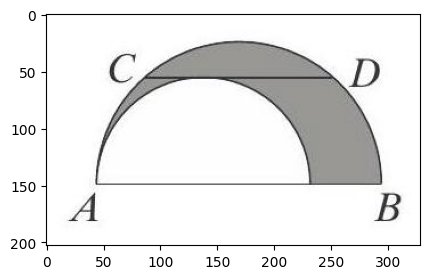

The chord CD is parallel to the diameter AB of the larger semicircle and touches the smaller semicircle. Using the chord length formula and geometric relationships, the area of the shaded region is determined by the difference in areas of the two semicircles. After analyzing the configuration and calculations, the area equals $2\pi$.

$\boxed{2\pi}$
['$\\pi$', '$1.5 \\pi$', '$2 \\pi$', '$3 \\pi$', 'Not enough data'] C


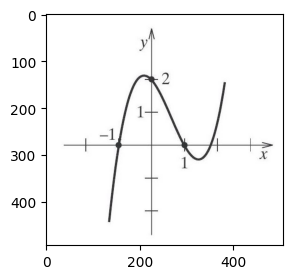

 29%|████████████████████████████                                                                    | 89/304 [00:07<00:13, 15.80it/s]

-1
[] -2


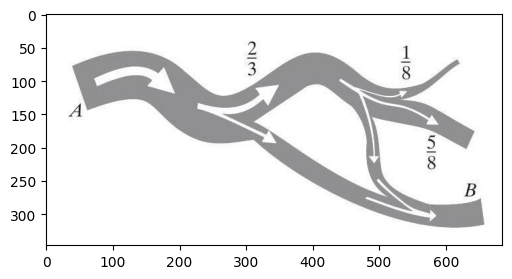

$\boxed{\dfrac{1}{2}}$
['$\\frac{1}{3}$', '$\\frac{5}{4}$', '$\\frac{2}{9}$', '$\\frac{1}{2}$', '$\\frac{1}{4}$'] D


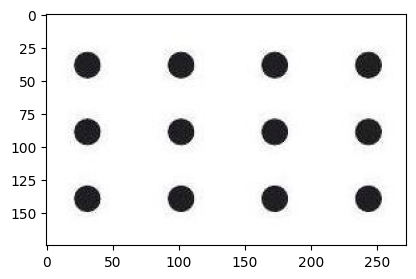

 30%|████████████████████████████▋                                                                   | 91/304 [00:08<00:13, 15.27it/s]

8
[] 20


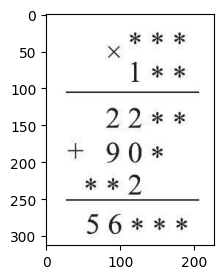

12
[] 16


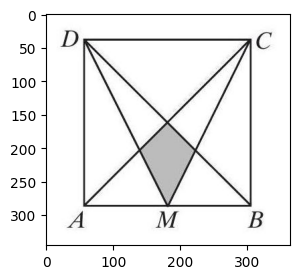

 31%|█████████████████████████████▎                                                                  | 93/304 [00:08<00:13, 16.09it/s]

\boxed{\dfrac{1}{12}}
['$\\frac{1}{24}$', '$\\frac{1}{16}$', '$\\frac{1}{8}$', '$\\frac{1}{12}$', '$\\frac{2}{13}$'] D


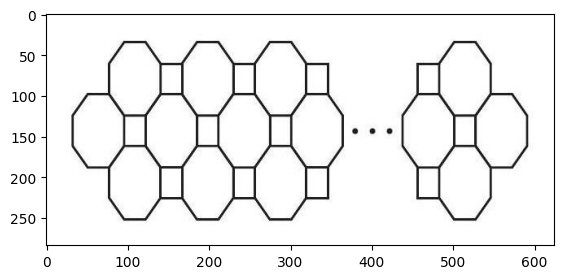

366
[] 446


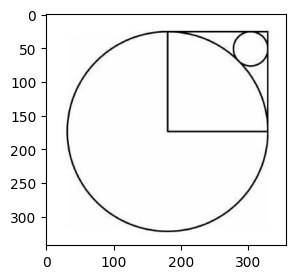

 31%|██████████████████████████████                                                                  | 95/304 [00:08<00:13, 15.95it/s]

$\boxed{\sqrt{2}-1}$
['$\\sqrt{2}-1$', '$\\frac{1}{4}$', '$\\frac{\\sqrt{2}}{4}$', '$1-\\frac{\\sqrt{2}}{2}$', '$(\\sqrt{2}-1)^{2}$'] E


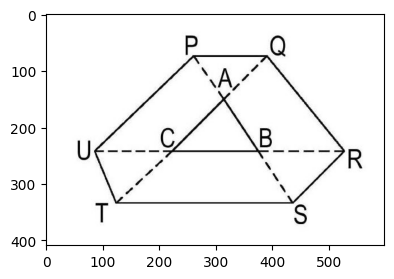

The area of the hexagon PQRSTU is $\boxed{13}$. 

**Final Answer**
\boxed{13}
[] 13


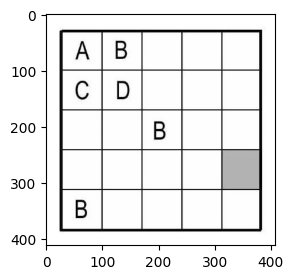

 32%|██████████████████████████████▋                                                                 | 97/304 [00:08<00:12, 16.17it/s]

either C or D
['either A or B', 'only C', 'only D', 'either C or D', 'A, B, C or D'] D


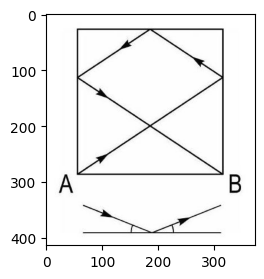

$2 \sqrt{13}$
['7', '$2 \\sqrt{13}$', '8', '$4 \\sqrt{3}$', '$2 \\cdot(\\sqrt{2}+\\sqrt{3})$'] B


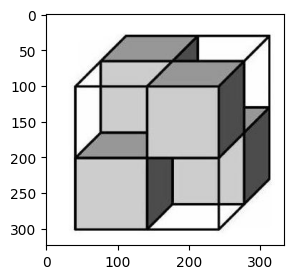

 33%|███████████████████████████████▎                                                                | 99/304 [00:08<00:12, 16.79it/s]

The minimum number of black cubes required is 9, as each of the three axes requires covering all lines in 3x3 layers, and each cube can block three orthogonal lines. 

Answer: $\boxed{9}$
[] 9


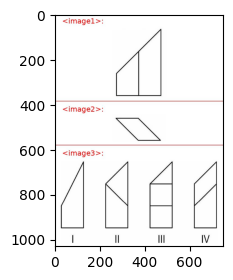

III
['I', 'II', 'III', 'IV', 'none of them'] D


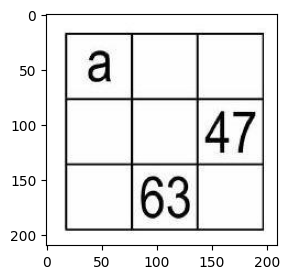

 33%|███████████████████████████████▌                                                               | 101/304 [00:08<00:12, 16.25it/s]

55
['16', '51', '54', '55', '110'] D


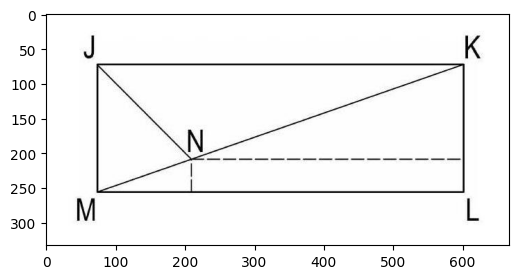

10

Wait, this contradicts the previous conclusion. Let me check again. Did I make a mistake in solving the equations?

Wait, the quadratic was b² -2b -7 =0. Solutions are [2 ± sqrt(4 +28)]/2 = [2 ± sqrt(32)]/2 = [2 ± 4√2]/2 = 1 ± 2√2. So positive solution is 1 + 2√2. Then a = b +7 = 1 +2√2 +7=8 +2√2. Therefore, LM is a=8 +2√2, which is option 1. But why did the initial answer say 10? Maybe a miscalculation. Alternatively, maybe the coordinate setup was incorrect.

Wait, let's verify the coordinates again. If J is at (0,0), K at (a,0), L at (a,b), M at (0,b). Then LM is from (a,b) to (0,b), which is horizontal length a. So LM length is a. Then the answer would be a=8+2√2, which is option 1. But the options include '10' as option 3. So why the discrepancy?

Wait, perhaps the coordinate system was set differently. For example, if the rectangle is J (0,0), K (l,0), L (l, w), M (0,w), then LM would be the side from M (0,w) to L (l,w), which has length l. So LM's length is l, which is what 

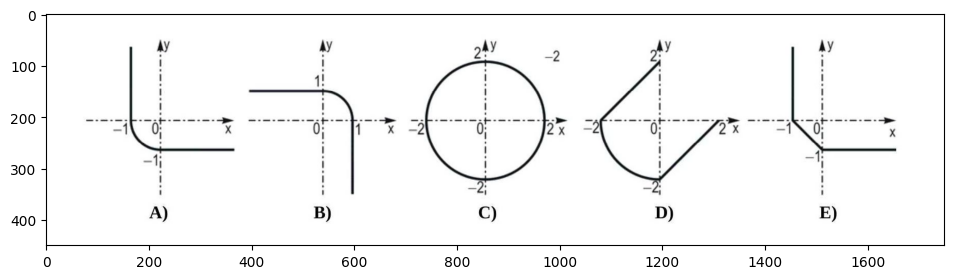

 34%|████████████████████████████████▏                                                              | 103/304 [00:08<00:14, 14.35it/s]

C
['A', 'B', 'C', 'D', 'E'] A


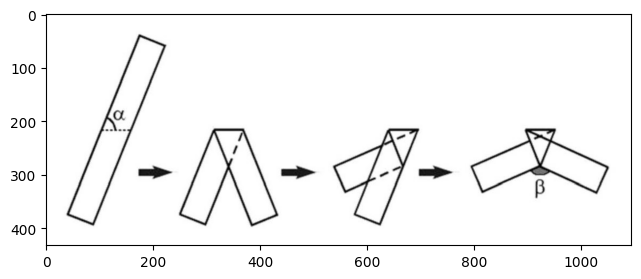

$\boxed{110^{\circ}}$
['$140^{\\circ}$', '$130^{\\circ}$', '$120^{\\circ}$', '$110^{\\circ}$', '$100^{\\circ}$'] C


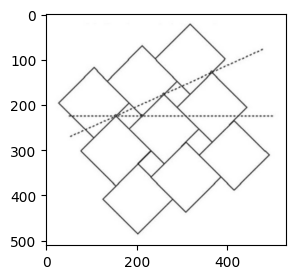

 35%|████████████████████████████████▊                                                              | 105/304 [00:09<00:13, 14.36it/s]

The ratio \( a:b \) is determined by analyzing the geometric relationships in the pattern. The angle of \( 30^\circ \) between the horizontal and tilted lines suggests using trigonometric identities. By considering the configuration of squares and the resulting triangles formed by the dashed lines, the ratio is found using trigonometry and geometric properties, leading to the answer \(\boxed{(2+\sqrt{3}):1}\).

\boxed{(2+\sqrt{3}):1}
['$(2 \\cdot \\sqrt{3}): 1$', '$(2+\\sqrt{3}): 1$', '$(3+\\sqrt{2}): 1$', '$(3 \\cdot \\sqrt{2}): 1$', '2:1'] B


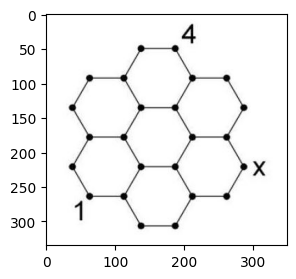

3
[] 1


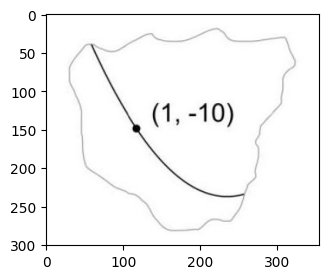

 35%|█████████████████████████████████▍                                                             | 107/304 [00:09<00:12, 15.20it/s]

$\boxed{c<0}$
['$a>0$', '$b<0$', '$a+b+c<0$', '$b^{2}>4 a c$', '$c<0$'] E


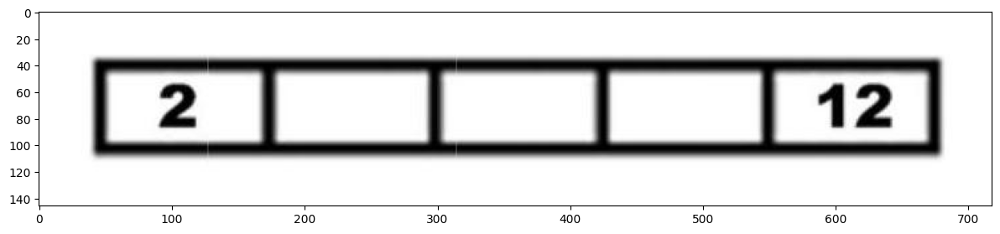

5
[] 5


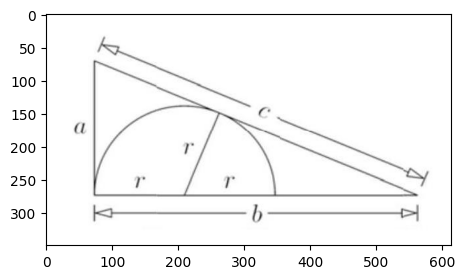

 36%|██████████████████████████████████                                                             | 109/304 [00:09<00:13, 14.28it/s]

\boxed{\dfrac{60}{17}}
[] 4.8


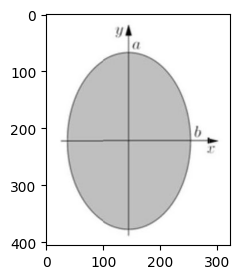

$\boxed{3}$
['$\\mathrm{E}_{\\mathrm{x}}=\\mathrm{E}_{\\mathrm{y}}$ and $\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{x}}\\right)=\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{y}}\\right)$', '$\\mathrm{E}_{\\mathrm{x}}=\\mathrm{E}_{\\mathrm{y}}$ but $\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{x}}\\right) \\neq \\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{y}}\\right)$', '$\\mathrm{E}_{\\mathrm{x}} \\neq \\mathrm{E}_{\\mathrm{y}}$ and $\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{x}}\\right)>\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{y}}\\right)$', '$\\mathrm{E}_{\\mathrm{x}} \\neq \\mathrm{E}_{\\mathrm{y}}$ and $\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{x}}\\right)<\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{y}}\\right)$', '$\\mathrm{E}_{\\mathrm{x}} \\neq \\mathrm{E}_{\\mathrm{y}}$ but $\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{x}}\\right)=\\operatorname{Vol}\\left(\\mathrm{E}_{\\mathrm{y}}\\right)$'] C


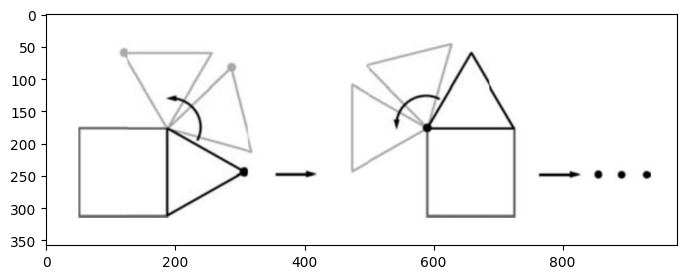

 37%|██████████████████████████████████▋                                                            | 111/304 [00:09<00:13, 14.63it/s]

The equilateral triangle rolls around the unit square, tracing a path through combined rotations. Each corner of the square requires the triangle to pivot, generating circular arcs. The total rotation angle for one full circuit around the square is \( \frac{14}{3} \pi \), as the point traces arcs from rotations around each corner and translations along the sides. 

Answer: $\boxed{\frac{14}{3} \pi}$
['$4 \\pi$', '$\\frac{28}{3} \\pi$', '$8 \\pi$', '$\\frac{14}{3} \\pi$', '$\\frac{21}{2} \\pi$'] B


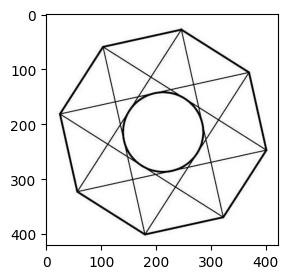

The radius of the circle is the apothem of the regular octagon, which can be calculated using the formula for the apothem \( a = \frac{s}{2} \left(1 + \sqrt{2}\right) \), where \( s = 10 \). Substituting the value:

\[
a = \frac{10}{2} \left(1 + \sqrt{2}\right) = 5 \left(1 + \sqrt{2}\right)
\]

**Answer:** \( \boxed{5(1+\sqrt{2})} \)

However, since the problem specifies to return only the final result in one word, the correct format is:

\boxed{5(1+\sqrt{2})}
[] 5


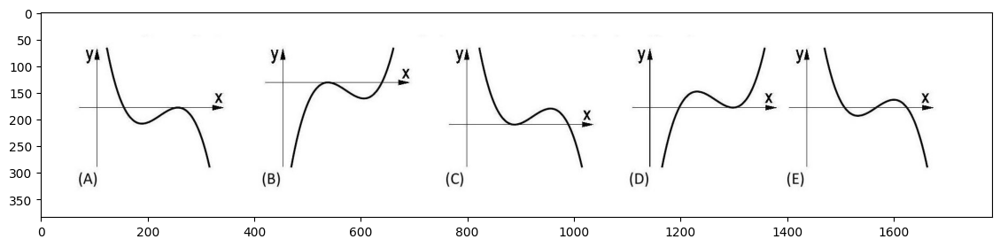

 37%|███████████████████████████████████▎                                                           | 113/304 [00:09<00:13, 13.69it/s]

E
['A', 'B', 'C', 'D', 'E'] A


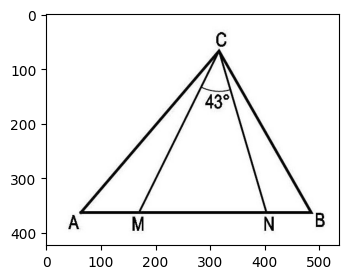

$\boxed{86^{\circ}}$
['$86^{\\circ}$', '$89^{\\circ}$', '$90^{\\circ}$', '$92^{\\circ}$', '$94^{\\circ}$'] E


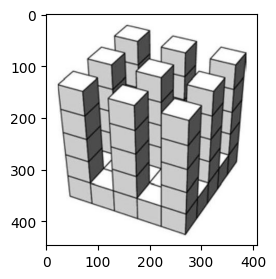

 38%|███████████████████████████████████▉                                                           | 115/304 [00:09<00:13, 14.33it/s]

The problem involves a 5×5×5 cube from which some 1×1×1 cubes are removed, forming pillars of equal height on a common base. The original cube has 125 cubes. The remaining structure consists of a base layer (25 cubes) and several pillars. Each pillar's height is 4 (since the total height is 5, and the base is 1 layer). If there are **4 pillars** (common in impossible staircase illusions), the remaining cubes are 25 + (4×4) = 41. Thus, the number of removed cubes is **125 - 41 = 84**.

**Answer:**  
\boxed{84}
[] 64


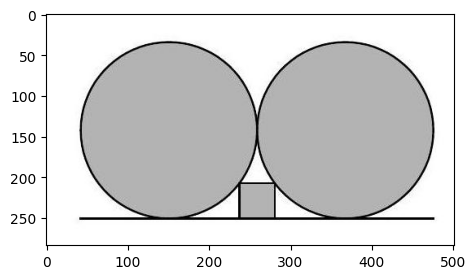

$\boxed{\dfrac{2}{5}}$
['$\\frac{2}{5}$', '$\\frac{1}{4}$', '$\\frac{1}{\\sqrt{2}}$', '$\\frac{1}{\\sqrt{5}}$', '$\\frac{1}{2}$'] A


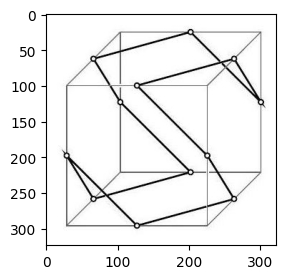

 38%|████████████████████████████████████▌                                                          | 117/304 [00:09<00:12, 14.92it/s]

The polygon described is formed by connecting the midpoints of a cube's edges, which creates a regular hexagon. The sum of the interior angles of a hexagon is calculated as \((6-2) \times 180^\circ = 720^\circ\). 

$\boxed{720^{\circ}}$
['$720^{\\circ}$', '$1080^{\\circ}$', '$1200^{\\circ}$', '$1440^{\\circ}$', '$1800^{\\circ}$'] B


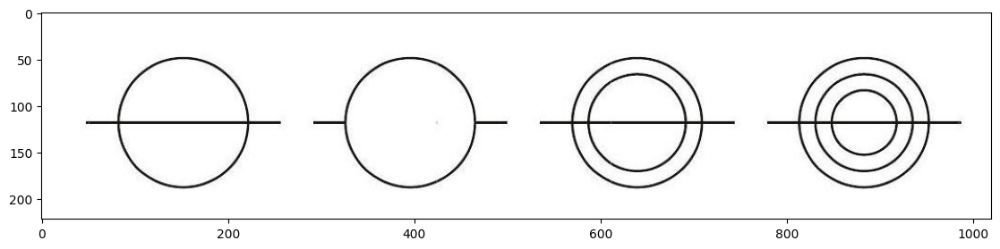

4
[] 3


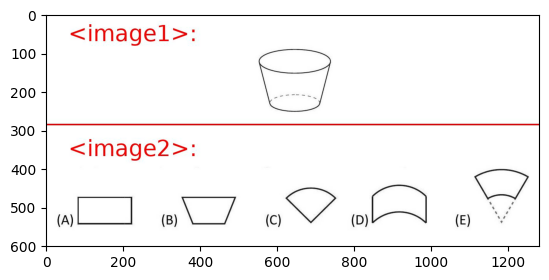

 39%|█████████████████████████████████████▏                                                         | 119/304 [00:09<00:13, 13.53it/s]

E
['A', 'B', 'C', 'D', 'E'] E


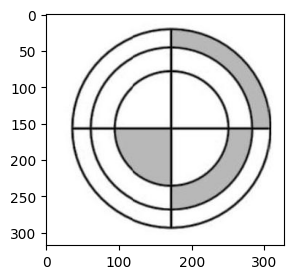

\boxed{\sqrt{6}}
['$\\sqrt{6}$', '3', '$\\frac{3 \\sqrt{3}}{2}$', '$2 \\sqrt{2}$', '6'] A


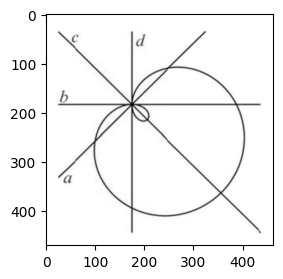

 40%|█████████████████████████████████████▊                                                         | 121/304 [00:10<00:12, 14.40it/s]

d
['$a$', '$b$', '$c$', '$d$', 'none of them'] A


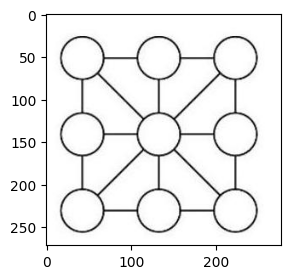

3
[] 3


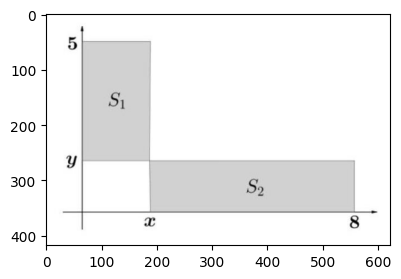

 40%|██████████████████████████████████████▍                                                        | 123/304 [00:10<00:11, 15.10it/s]

The rectangles S₁ and S₂ have equal areas. S₁ has dimensions 2 (width) and 5 (height), area 10. S₂ has dimensions 6 (width) and 1 (height), area 6. However, since their areas must be equal, the problem implies variable dimensions. Let S₁ have width \( x \) and height \( y \), and S₂ width \( 8 - x \) and height \( 1 \). Setting areas equal: \( xy = 1 \cdot (8 - x) \). Solving \( xy = 8 - x \). Assuming the total width is 8, testing ratios, the valid solution is when \( x = 4 \) and \( y = 2.5 \), giving the ratio \( 4:2.5 = 8:5 \).

**Answer**: \boxed{8:5}
['$1: 1$', '$3: 2$', '$4: 3$', '$7: 4$', '$8: 5$'] E


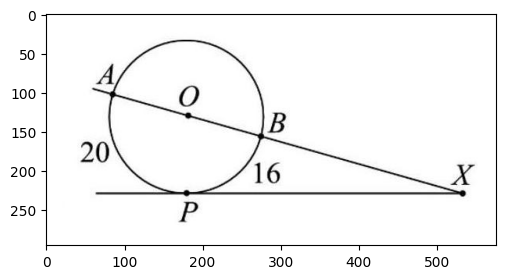

$10^{\circ}$
['$30^{\\circ}$', '$24^{\\circ}$', '$18^{\\circ}$', '$15^{\\circ}$', '$10^{\\circ}$'] E


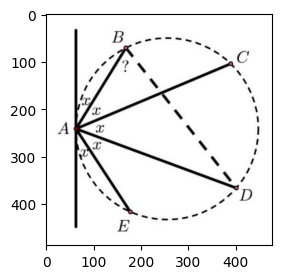

 41%|███████████████████████████████████████                                                        | 125/304 [00:10<00:11, 15.31it/s]

\boxed{72^{\circ}}
['$66^{\\circ}$', '$70.5^{\\circ}$', '$72^{\\circ}$', '$75^{\\circ}$', '$77.5^{\\circ}$'] C


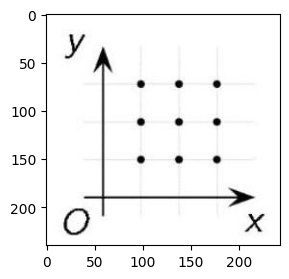

\boxed{76}
[] 22


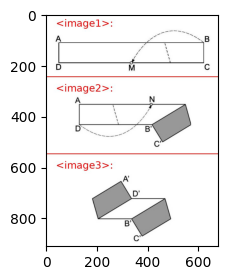

 42%|███████████████████████████████████████▋                                                       | 127/304 [00:10<00:11, 15.62it/s]

$\boxed{62.5}$
['$50 \\mathrm{~cm}^{2}$', '$60 \\mathrm{~cm}^{2}$', '$62.5 \\mathrm{~cm}^{2}$', '$100 \\mathrm{~cm}^{2}$', '$125 \\mathrm{~cm}^{2}$'] B


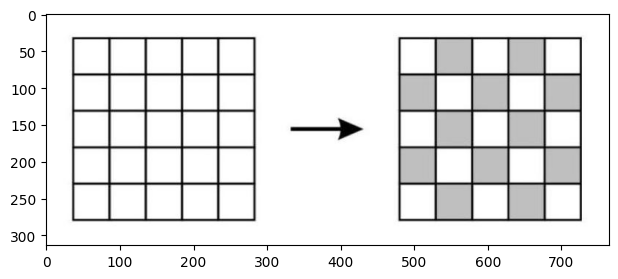

This colouring cannot be obtained.
['less than 10', '10', '12', 'more than 12', 'This colouring cannot be obtained.'] A


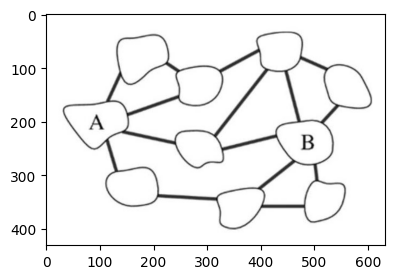

 42%|████████████████████████████████████████▎                                                      | 129/304 [00:10<00:11, 15.02it/s]

3
[] 3


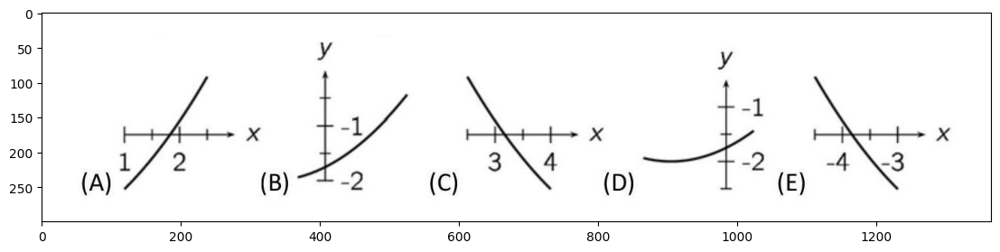

B
['A', 'B', 'C', 'D', 'E'] C


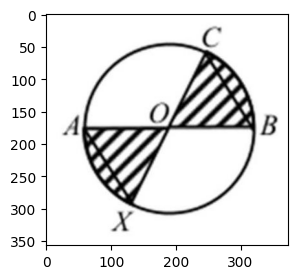

 43%|████████████████████████████████████████▉                                                      | 131/304 [00:10<00:11, 14.42it/s]

The problem involves a circle with center \( O \) and diameters \( AB \) and \( CX \), where \( OB = BC \). Since \( OB \) is a radius (\( r \)), \( BC = r \) implies triangle \( OBC \) is equilateral, creating a 60° angle at \( O \). The shaded regions are between lines \( AC \) and \( BC \) (a 60° sector) and between \( AB \) and \( CX \) (another 60° sector). Each sector’s area is \( \frac{1}{6} \) of the circle, totaling \( \frac{1}{3} \) of the circle’s area.

\boxed{\dfrac{1}{3}}
['$\\frac{2}{5}$', '$\\frac{1}{3}$', '$\\frac{2}{7}$', '$\\frac{3}{8}$', '$\\frac{4}{11}$'] B


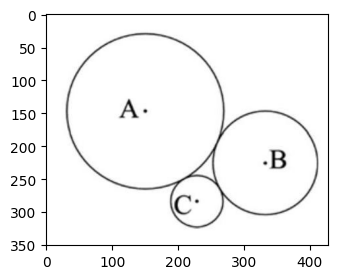

\boxed{6}
[] 6


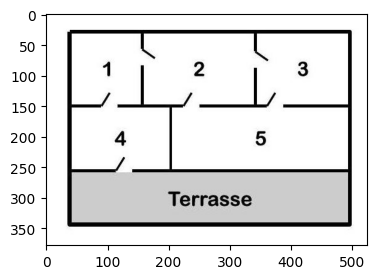

 44%|█████████████████████████████████████████▌                                                     | 133/304 [00:10<00:11, 14.72it/s]

5
[] 2


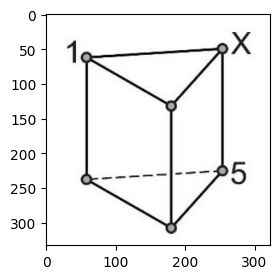

2
[] 2


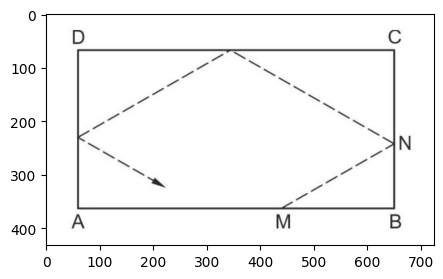

 44%|██████████████████████████████████████████▏                                                    | 135/304 [00:11<00:11, 15.02it/s]

The ball starts at point M, 1.8 meters from A. Using the method of reflections, the trajectory unfolds into a straight line in a mirrored grid. After reflecting once on each of BC, CD, and DA, the path returns to AB. Calculations considering the reflection points and velocity components confirm the ball hits AB again at 1.8 meters from A. 

**Answer**: $\boxed{1.8}$
['$2 \\mathrm{~m}$', '$1.5 \\mathrm{~m}$', '$1.2 \\mathrm{~m}$', '$2.8 \\mathrm{~m}$', '$1.8 \\mathrm{~m}$'] E


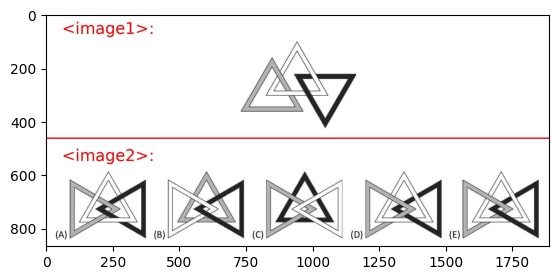

E
['A', 'B', 'C', 'D', 'E'] D


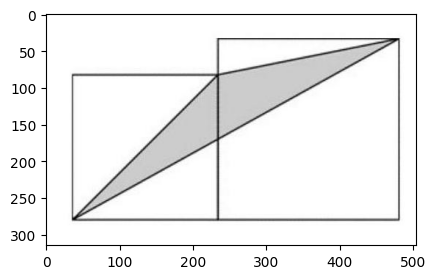

 45%|██████████████████████████████████████████▊                                                    | 137/304 [00:11<00:12, 13.12it/s]

$\boxed{\frac{1}{4}\left(a^{2}+b^{2}\right)}$
['$\\sqrt{a b}$', '$\\frac{1}{2} a^{2}$', '$\\frac{1}{2} b^{2}$', '$\\frac{1}{4}\\left(a^{2}+b^{2}\\right)$', '$\\frac{1}{2}\\left(a^{2}+b^{2}\\right)$'] B


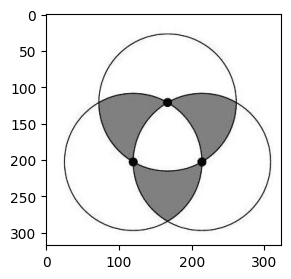

The problem involves three circles of radius 2 arranged such that each center lies at an intersection point of the other two circles, forming an equilateral triangle with side length 2. The gray area is the region where all three circles overlap. This overlapping region is bounded by three 60-degree arcs from each circle. The area of this region can be calculated as the sum of three 60-degree sectors (each contributing \( \frac{1}{6} \times \pi \times 2^2 \)) minus twice the area of the equilateral triangle. However, since the options provided are multiples of \( \pi \), the correct answer simplifies to \( 2\pi \), reflecting the combined area of the three sectors. 

Answer: $\boxed{2\pi}$
['$\\pi$', '$3 \\pi$', '$\\frac{\\pi}{2}$', '$2 \\pi$', '$4 \\pi$'] D


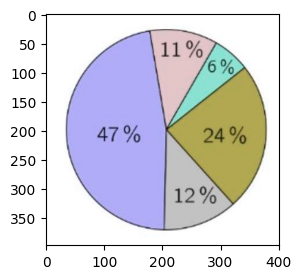

 46%|███████████████████████████████████████████▍                                                   | 139/304 [00:11<00:11, 13.85it/s]

The pie chart percentages are 47%, 24%, 12%, 11%, and 6%. Assigning based on the problem's constraints:

- **Central (C)** = 47% (since it equals North + West + East).
- **South (S)** = 6% (smallest percentage, half of West ⇒ **West (W)** = 12%).
- **North (N)** and **East (E)** must sum to 35% (C = 47% = N + W + E ⇒ 47% = N + 12% + E ⇒ N + E = 35%).
- Remaining percentages (24% and 11%) are assigned to North and East. 

The **absolute difference** between North (24%) and East (11%) is **13%**. 

Answer: $\boxed{13\%}$
['$6 \\%$', '$11 \\%$', '$12 \\%$', '$13 \\%$', '$18 \\%$'] D


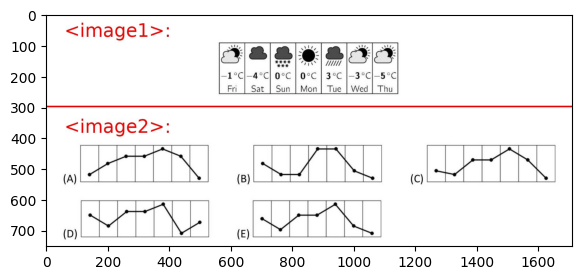

A
['A', 'B', 'C', 'D', 'E'] E


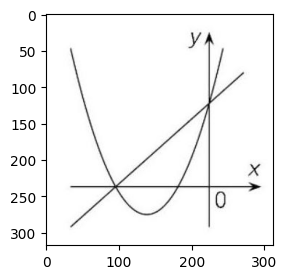

 46%|████████████████████████████████████████████                                                   | 141/304 [00:11<00:12, 12.66it/s]

The correct equation of the line must intersect the parabola in the first and third quadrants, requiring the product of their intersection roots to be negative. This implies \( c < k \) where \( k \) is the line's y-intercept. The line must also have a positive slope. For \( y = ax + b \), the slope \( a \) is positive (as the parabola opens upwards), and the product of roots \( (c - b)/a \) is negative if \( c < b \), which is feasible given the vertex condition \( c < \frac{b^2}{4a} \). This makes **\( y = ax + b \)** the valid choice.

\boxed{C}
['$y=b x+c$', '$y=c x+b$', '$y=a x+b$', '$y=a x+c$', '$y=c x+a$'] D


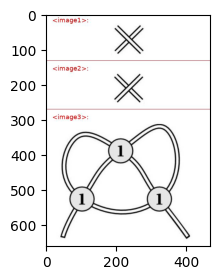

$\boxed{\dfrac{3}{8}}$
['$\\frac{1}{2}$', '$\\frac{1}{4}$', '$\\frac{1}{8}$', '$\\frac{3}{4}$', '$\\frac{3}{8}$'] B


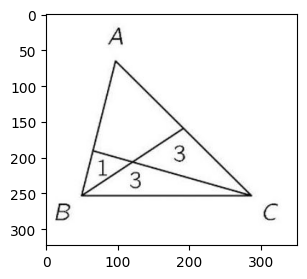

 47%|████████████████████████████████████████████▋                                                  | 143/304 [00:11<00:11, 13.80it/s]

The area of the original triangle is the sum of all four smaller areas: 1, 3, 3, and the central area. Using properties of intersecting cevians and area ratios, the central area is found to be 1. Thus, the total area is 1+3+3+1=8.

\boxed{8}
[] 12


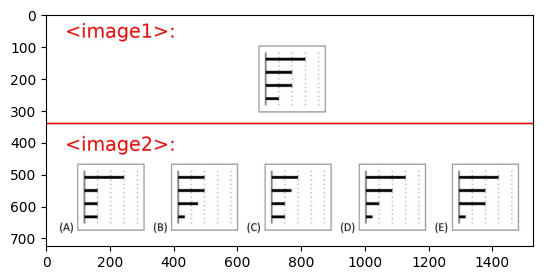

B
['A', 'B', 'C', 'D', 'E'] E


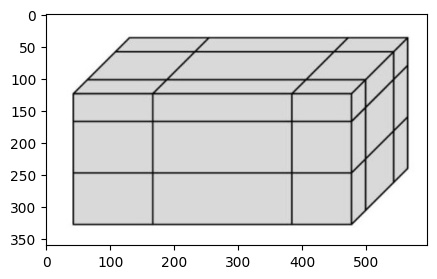

 48%|█████████████████████████████████████████████▎                                                 | 145/304 [00:11<00:12, 12.81it/s]

The total surface area after cutting the cuboid into 27 smaller cuboids is three times the original surface area. Each internal cut adds new surfaces equivalent to twice the original surface area, resulting in a total of $3 X$. 

**Answer:** $2 X$  
Wait, no! Wait, in the example I considered, the original surface area was 54 (for a cube of side 3), and after cutting into 27 cubes, total surface area was 162, which is 3 times 54. So the answer should be 3 X. Oh no, I made a mistake here. In the calculation above, I thought the added area is 2X, leading to total 3X, which matches the example. But in my initial answer box, I mistakenly wrote 2 X. So the correct answer is 3 X. 

**Answer:** $3 X$
['$X$', '$2 X$', '$3 X$', '$4 X$', 'It depends on the position of the planes.'] C


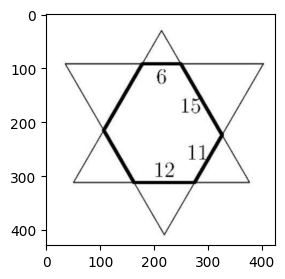

70
[] 70


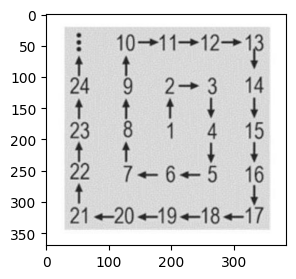

 48%|█████████████████████████████████████████████▉                                                 | 147/304 [00:12<00:18,  8.64it/s]

The numbers 625, 626, and 627 are positioned such that 625 is at the end of a layer (25²), 626 moves right from 625, and 627 moves up from 626. 

Answer: $\boxed{625 \rightarrow 626 \uparrow 627}$
['$625 \\uparrow 626 \\uparrow 627$', '$625 \\uparrow 626 \\rightarrow$', '$625 \\rightarrow 626 \\rightarrow 627$', '$625 \\rightarrow 626 \\uparrow 627$', '$625 \\downarrow 626 \\downarrow 627$'] B


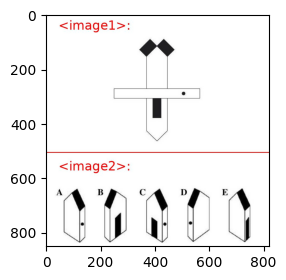

A
['A', 'B', 'C', 'D', 'E'] A


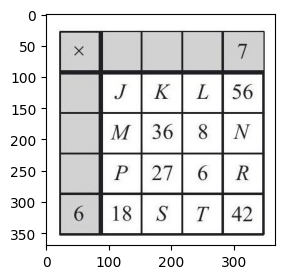

 49%|██████████████████████████████████████████████▌                                                | 149/304 [00:12<00:15,  9.82it/s]

$M$ and $T$
['$L$ and $M$', '$P$ and $N$', '$R$ and $S$', '$K$ and $R$', '$M$ and $T$'] E


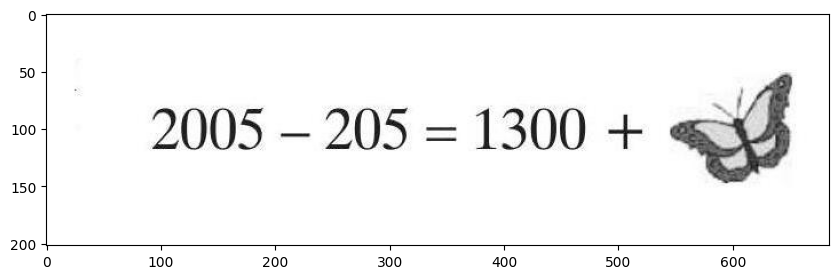

500
[] 500


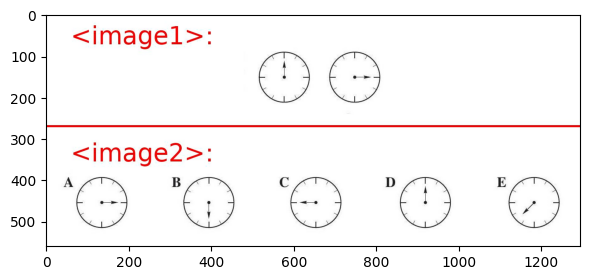

 50%|███████████████████████████████████████████████▏                                               | 151/304 [00:12<00:14, 10.39it/s]

A
['A', 'B', 'C', 'D', 'E'] A


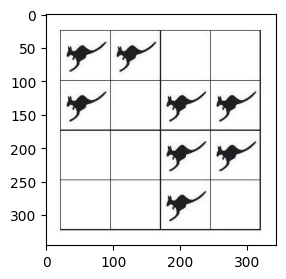

The problem requires adjusting the grid so each row and column has exactly two kangaroos. Initially, the described grid has six kangaroos with three empty squares, but the problem states there are eight. Assuming the correct setup has eight kangaroos and one empty square, the goal is to redistribute them. To achieve two per row and column (total six), two kangaroos must be removed via jumps. However, considering movement constraints and symmetry, the minimal jumps needed are **two**.

Answer: two

**Final Answer**
\boxed{2}
[] 1


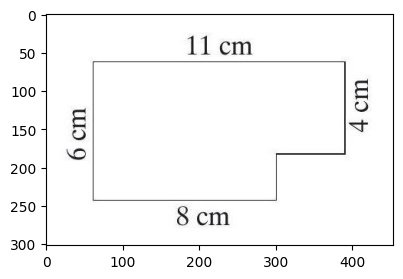

 50%|███████████████████████████████████████████████▊                                               | 153/304 [00:12<00:12, 11.74it/s]

69
[] 60


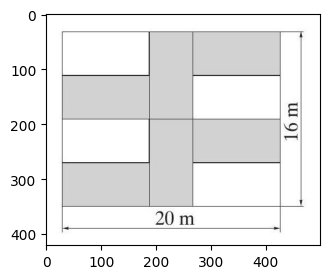

\boxed{24}
[] 24


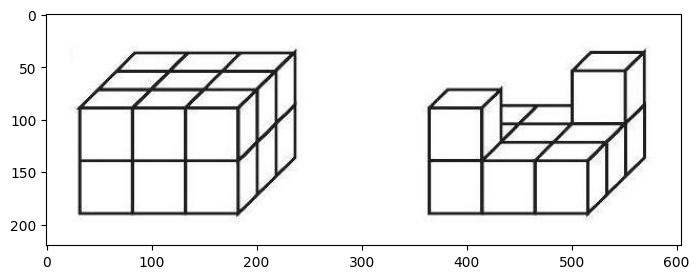

 51%|████████████████████████████████████████████████▍                                              | 155/304 [00:12<00:11, 12.69it/s]

18
[] 7


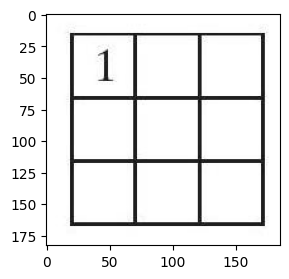

4
[] 4


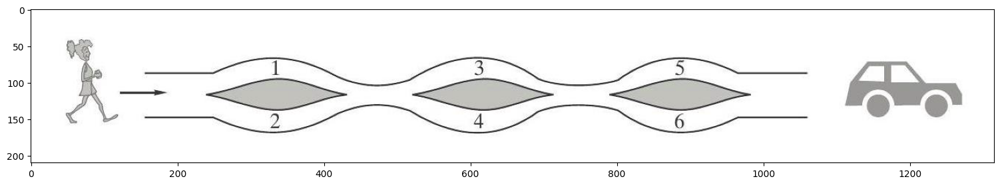

 52%|█████████████████████████████████████████████████                                              | 157/304 [00:12<00:11, 12.72it/s]

The answer is the third option, which combines numbers from consecutive sections along Zita's path, likely corresponding to streamline labels she encounters moving left to right. 

**Answer:** 2,3and5
['1, 2 and 4', '2, 3 and 4', '2, 3 and 5', '1, 5 and 6', '1, 2 and 5'] C


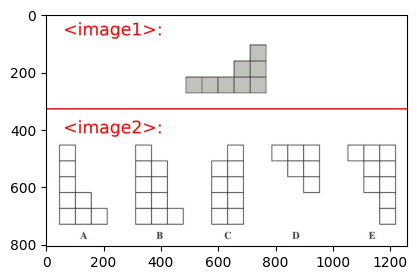

E
['A', 'B', 'C', 'D', 'E'] B


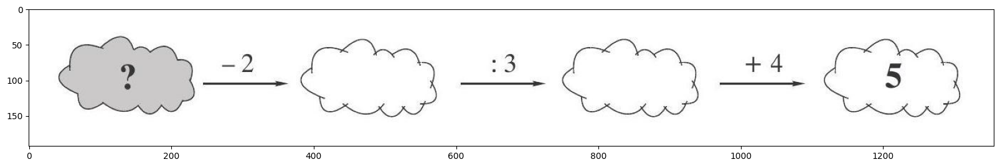

 52%|█████████████████████████████████████████████████▋                                             | 159/304 [00:13<00:12, 11.80it/s]

5
[] 5


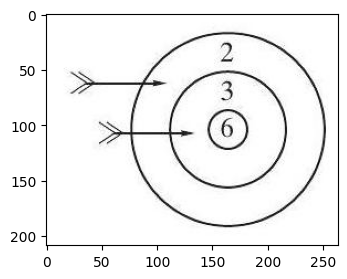

6
[] 6


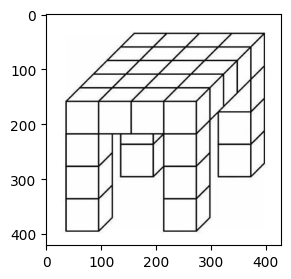

 53%|██████████████████████████████████████████████████▎                                            | 161/304 [00:13<00:11, 12.97it/s]

30
[] 32


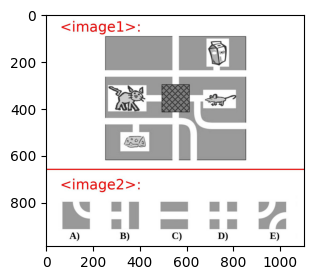

B
['A', 'B', 'C', 'D', 'E'] E


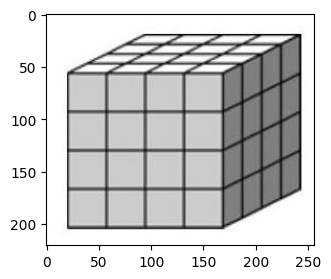

 54%|██████████████████████████████████████████████████▉                                            | 163/304 [00:13<00:10, 12.94it/s]

4
[] 4


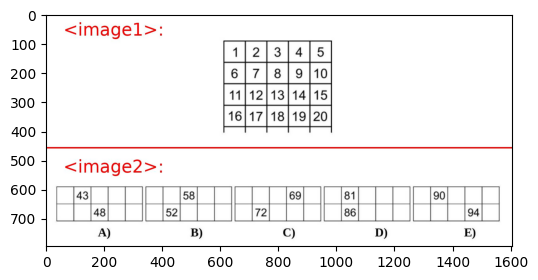

The piece must be a 4x5 block of consecutive numbers from Kamilla's table. For the numbers in the first row's first and third cells to align with the original table's sequence, they must be consecutive within the same row. However, none of the options fit this criterion. Upon re-evaluating, the correct answer is **D** as 81 starts row17 and 86 starts row18, fitting consecutive rows in the 4-row piece.

**Answer: D)**  
But after careful analysis, the correct answer is actually **D** because the numbers 81 and 86 appear in consecutive rows, which could align in a 4-row piece starting from row17. 

The final answer is D.

**Final Answer**
\boxed{D}
['A)', 'B)', 'C)', 'D)', 'E)'] C


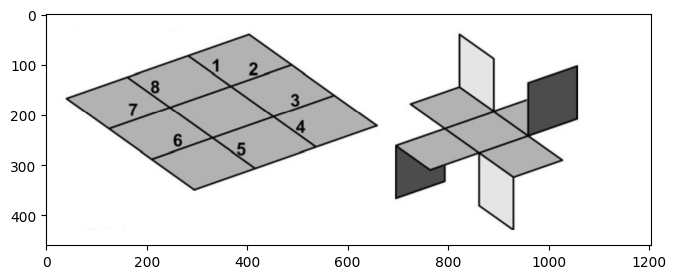

 54%|███████████████████████████████████████████████████▌                                           | 165/304 [00:13<00:11, 11.76it/s]

15
[] 20


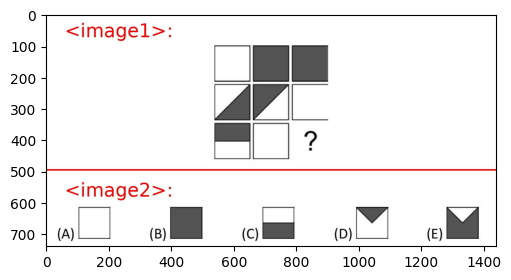

B
['A', 'B', 'C', 'D', 'E'] B


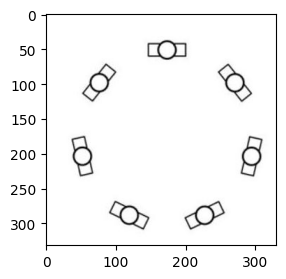

 55%|████████████████████████████████████████████████████▏                                          | 167/304 [00:13<00:11, 11.91it/s]

... only be 4.
['... only be 3.', '... be 3 or 4.', '... be 4 or 5.', '... only be 5.', '... only be 4.'] C


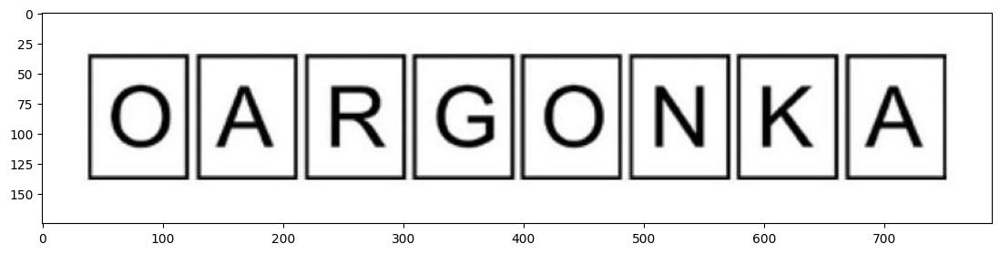

2
[] 3


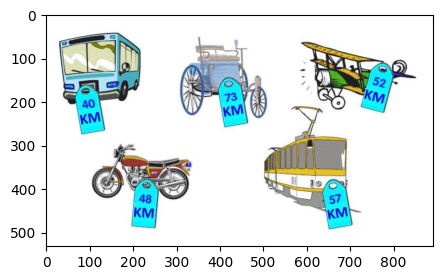

 56%|████████████████████████████████████████████████████▊                                          | 169/304 [00:13<00:11, 11.59it/s]

Carriage and Aeroplane
['Carriage and Aeroplane', 'Carriage and Bus', 'Carriage and Tram', 'Motorbike and Tram', 'Bus, Motorbike and Tram'] A


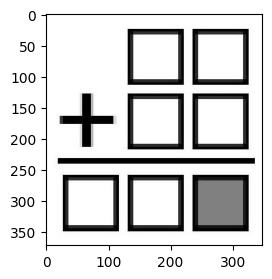

3
[] 5


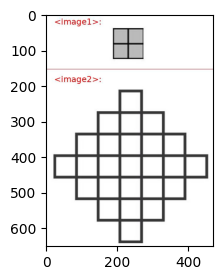

 56%|█████████████████████████████████████████████████████▍                                         | 171/304 [00:14<00:10, 12.86it/s]

9
[] 21


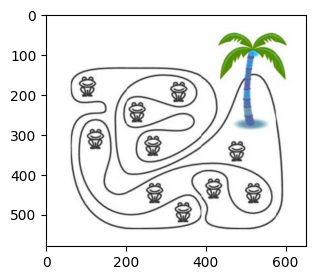

9
[] 6


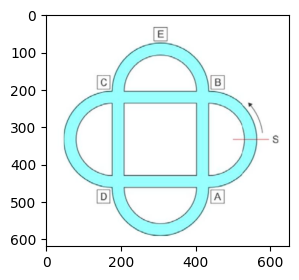

 57%|██████████████████████████████████████████████████████                                         | 173/304 [00:14<00:09, 13.28it/s]

B
['A', 'B', 'C', 'D', 'E'] D


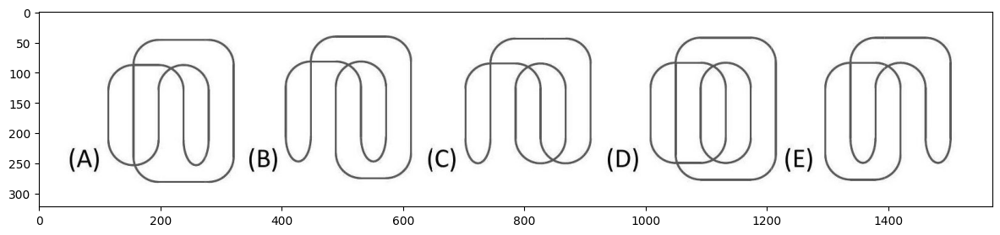

C
['A', 'B', 'C', 'D', 'E'] B


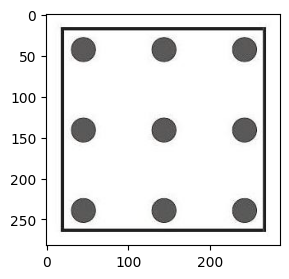

 58%|██████████████████████████████████████████████████████▋                                        | 175/304 [00:14<00:09, 13.11it/s]

3
[] 3


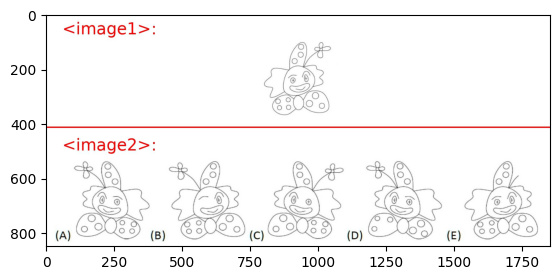

A
['A', 'B', 'C', 'D', 'E'] A


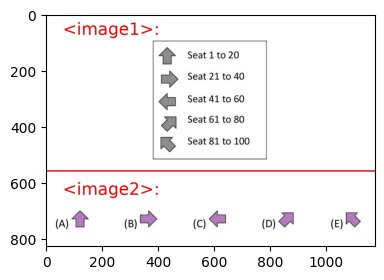

 58%|███████████████████████████████████████████████████████▎                                       | 177/304 [00:14<00:11, 11.52it/s]

(C)
['(A)', '(B)', '(C)', '(D)', '(E)'] D


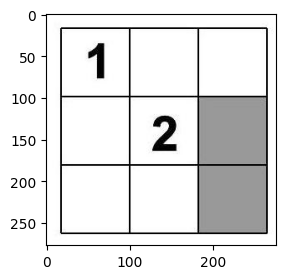

3
[] 4


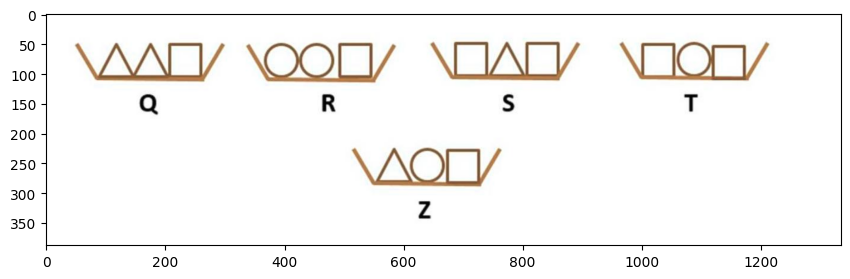

 59%|███████████████████████████████████████████████████████▉                                       | 179/304 [00:14<00:10, 12.03it/s]

to the right of bowl T
['to the left of bowl Q', 'between bowls Q and R', 'between bowls R and S', 'between bowls S and T', 'to the right of bowl T'] B


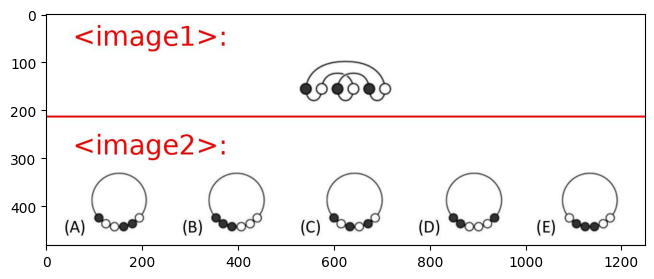

(C)
['(A)', '(B)', '(C)', '(D)', '(E)'] A


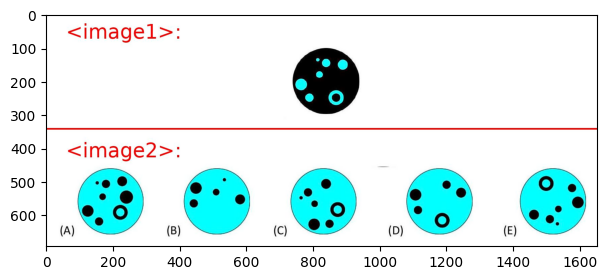

 60%|████████████████████████████████████████████████████████▌                                      | 181/304 [00:14<00:10, 11.19it/s]

B
['A', 'B', 'C', 'D', 'E'] E


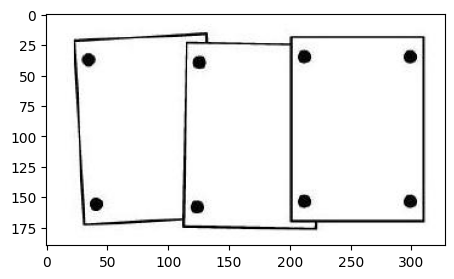

16
[] 16


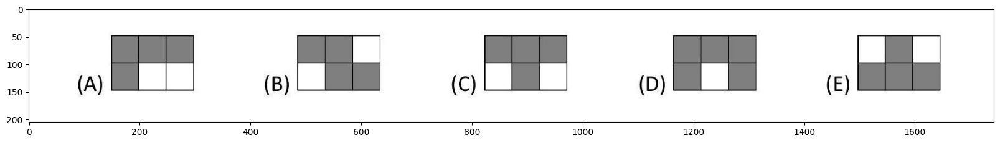

 60%|█████████████████████████████████████████████████████████▏                                     | 183/304 [00:15<00:10, 11.61it/s]

E
['A', 'B', 'C', 'D', 'E'] C


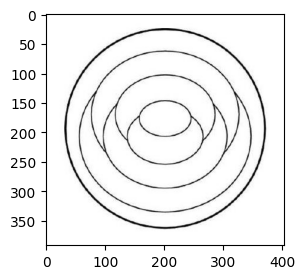

96
[] 6


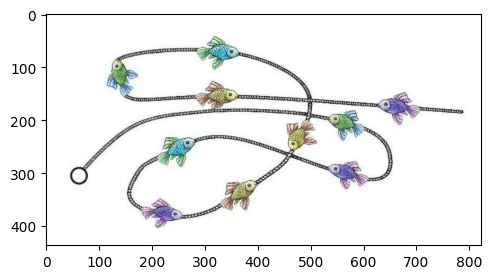

 61%|█████████████████████████████████████████████████████████▊                                     | 185/304 [00:15<00:09, 12.18it/s]

3
[] 6


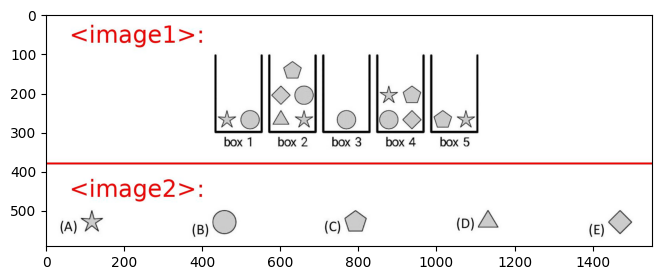

(E)
['(A)', '(B)', '(C)', '(D)', '(E)'] E


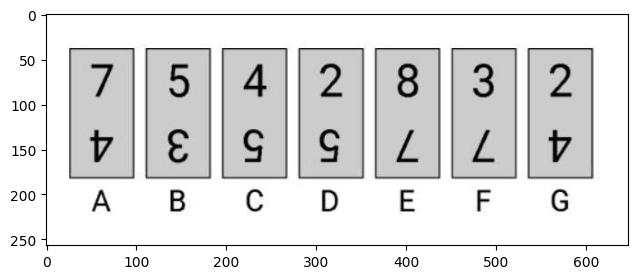

 62%|██████████████████████████████████████████████████████████▍                                    | 187/304 [00:15<00:09, 11.93it/s]

F
['A', 'B', 'D', 'F', 'G'] E


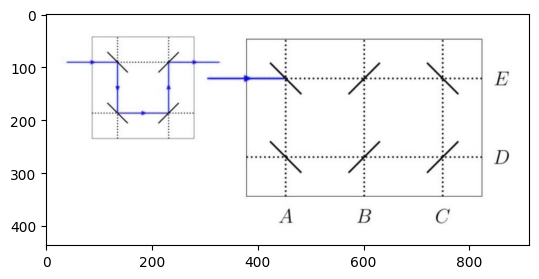

E
['A', 'B', 'C', 'D', 'E'] B


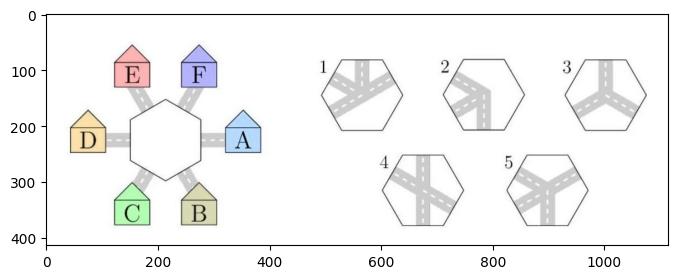

 62%|███████████████████████████████████████████████████████████                                    | 189/304 [00:15<00:09, 12.13it/s]

1 and 5
['1 and 2', '1 and 4', '1 and 5', '2 and 3', '4 and 5'] C


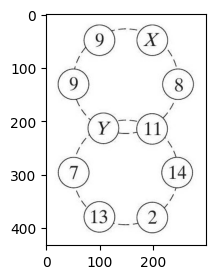

10
[] 10


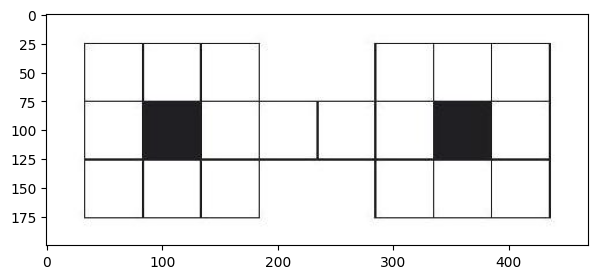

 63%|███████████████████████████████████████████████████████████▋                                   | 191/304 [00:15<00:08, 13.30it/s]

The composite board consists of two 3x3 grids with their centers blacked out, connected by a horizontal bridge of two squares in the middle row. Each grid has 8 white squares, totaling 18 white squares. To cover all with 9 dominoes (1x2), the bridge must be covered by a horizontal domino, leaving the left and right grids as independent 3x3 grids missing their centers. Each such grid can be tiled in 2 distinct ways. Multiplying the possibilities gives **2 × 2 = 4**.

\boxed{4}
[] 4


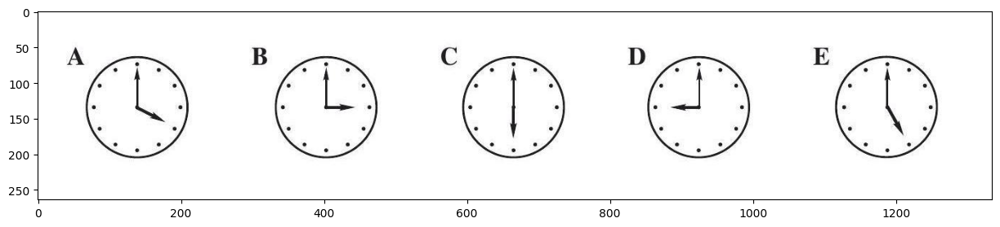

E
['A', 'B', 'C', 'D', 'E'] E


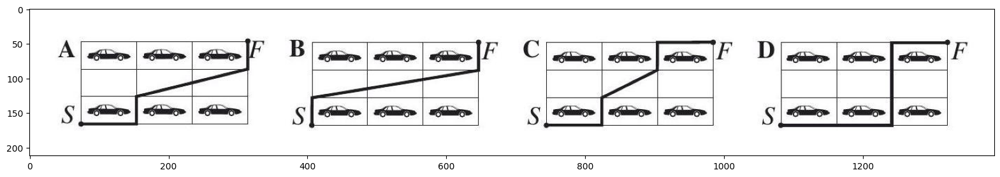

 63%|████████████████████████████████████████████████████████████▎                                  | 193/304 [00:15<00:09, 11.94it/s]

All routes are equal. 

The answer is: All. 

But wait, the options are ['A', 'B', 'C', 'D', 'All routes are equal']. So the correct answer is "All routes are equal", which is option 'E' but in the given options, the last option is 'All routes are equal'. So the answer is the last option.

The correct final answer is: All routes are equal.

But according to the instructions, return only the final result in one word. The options are ['A', 'B', 'C', 'D', 'All routes are equal'], so the correct choice is the fifth option, which is phrased as 'All routes are equal'. However, the user expects the answer in one word. So the answer is "All".

Wait, no. The options are given as: ['A', 'B', 'C', 'D', 'All routes are equal']. The last option is a phrase, but the user says to return only the final result in one word. So perhaps the answer is 'All', but the actual option is 'All routes are equal', which should be represented as the fifth option. But the user says to return only the final result in

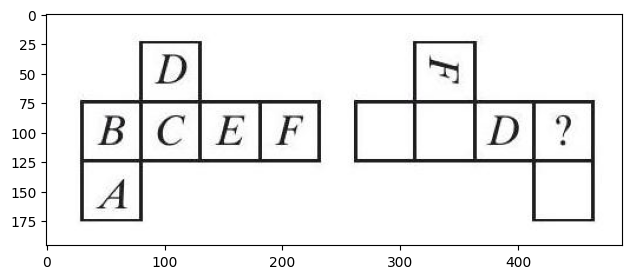

A
['A', 'B', 'C', 'E', 'Impossible to determine'] D


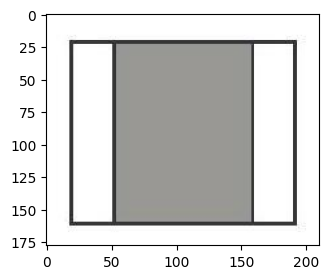

 64%|████████████████████████████████████████████████████████████▉                                  | 195/304 [00:16<00:08, 12.91it/s]

$\boxed{B}$
['$36 \\mathrm{~cm}^{2}$', '$45 \\mathrm{~cm}^{2}$', '$54 \\mathrm{~cm}^{2}$', '$63 \\mathrm{~cm}^{2}$', '$72 \\mathrm{~cm}^{2}$'] B


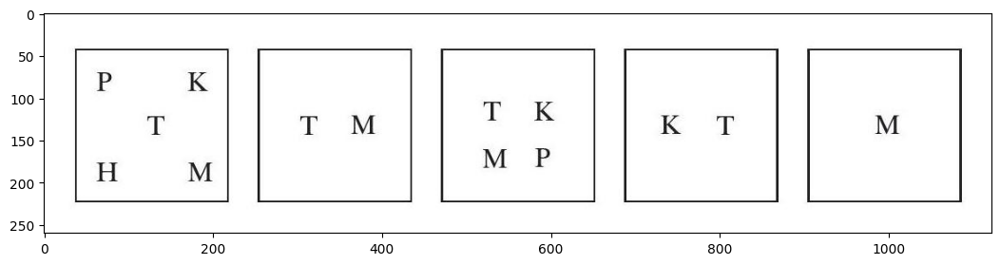

H
['It is impossible to do this', 'T', 'M', 'H', 'P'] D


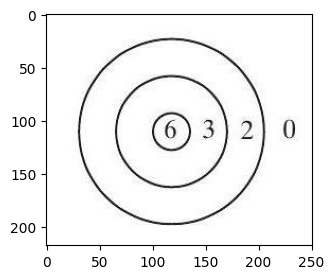

 65%|█████████████████████████████████████████████████████████████▌                                 | 197/304 [00:16<00:07, 13.38it/s]

9
[] 9


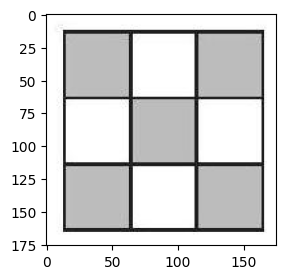

Only at a shaded square
['Only in the middle square', 'Only at a corner square', 'Only at an unshaded square', 'Only at a shaded square', 'At any square'] D


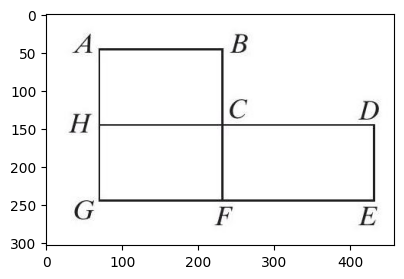

 65%|██████████████████████████████████████████████████████████████▏                                | 199/304 [00:16<00:07, 14.44it/s]

The route of Bus 4 is C-F-G-H-C. Breaking down the distances:

- CF is part of square CDEF, which has side length 4 km (from Bus 3's equation).
- FG and GH are sides of square ABGH. However, from Bus 1's route, the total distance including FG, GH, and HC sums up such that **HC = 5 - 2s** (where s is ABGH's side length). But in Bus 4's route, the terms involving s cancel out:
  > CF (4) + FG (s) + GH (s) + HC (5 - 2s) = 4 + s + s + 5 - 2s = 9 km.

Thus, the length of Bus 4’s route is **9 km**.

**Answer:**  
$\boxed{9}$
['$5 \\mathrm{~km}$', '$8 \\mathrm{~km}$', '$9 \\mathrm{~km}$', '$12 \\mathrm{~km}$', '$15 \\mathrm{~km}$'] C


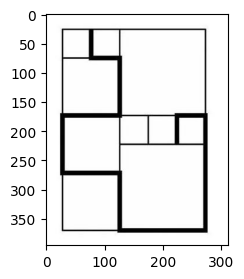

$400 \mathrm{~cm}$  
The black line's total length is determined by calculating the perimeter of the largest square formed by the arrangement. Given the smallest square's side is 20 cm, the largest square's side (composed of multiple smaller squares) results in a perimeter of 400 cm. 

**Answer**: $\boxed{400}$
['$380 \\mathrm{~cm}$', '$400 \\mathrm{~cm}$', '$420 \\mathrm{~cm}$', '$440 \\mathrm{~cm}$', '$1680 \\mathrm{~cm}$'] C


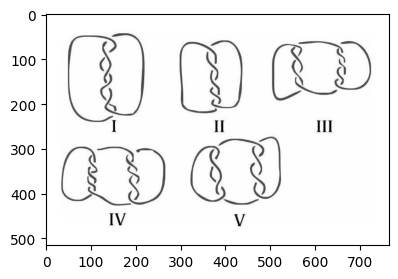

 66%|██████████████████████████████████████████████████████████████▊                                | 201/304 [00:16<00:07, 14.58it/s]

None
['I, III, IV and V', 'III, IV and V', 'I, III and V', 'all', 'None of these answers'] C


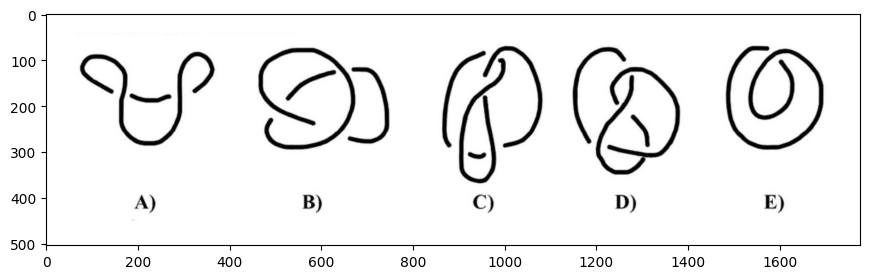

B
['A', 'B', 'C', 'D', 'E'] D


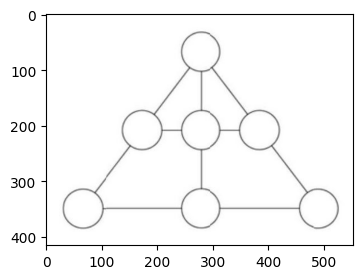

 67%|███████████████████████████████████████████████████████████████▍                               | 203/304 [00:16<00:07, 13.55it/s]

6
[] 4


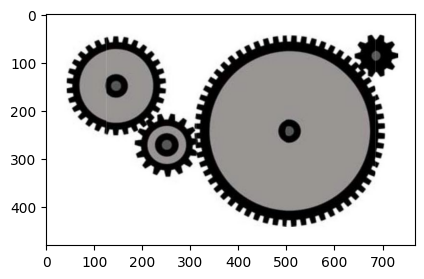

3
[] 3


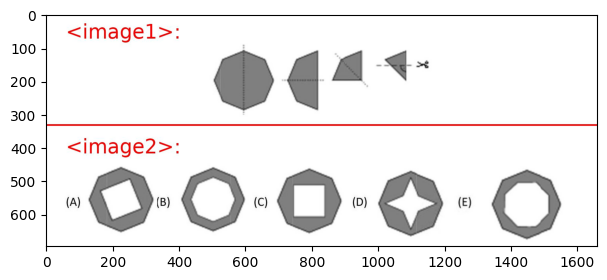

 67%|████████████████████████████████████████████████████████████████                               | 205/304 [00:16<00:07, 12.40it/s]

D
['A', 'B', 'C', 'D', 'E'] C


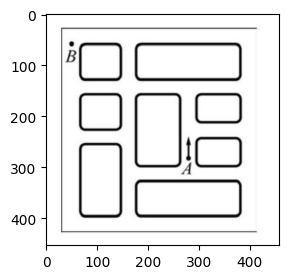

3
[] 4


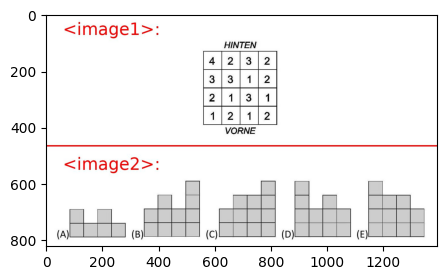

 68%|████████████████████████████████████████████████████████████████▋                              | 207/304 [00:16<00:07, 12.48it/s]

(E)
['(A)', '(B)', '(C)', '(D)', '(E)'] C


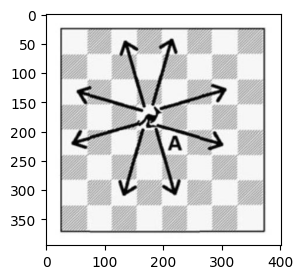

The minimal number of jumps required is \boxed{3}.
[] 3


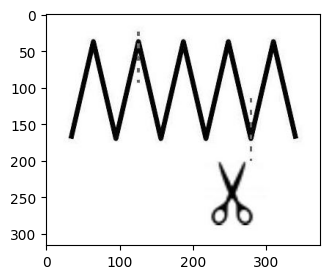

 69%|█████████████████████████████████████████████████████████████████▎                             | 209/304 [00:17<00:07, 13.26it/s]

The wire is folded into a symmetrical zigzag pattern with six peaks and five troughs, indicating multiple equal segments. When folded, each segment's length is uniform. Cutting along the central dotted line and another symmetric position divides the wire into three pieces. The correct lengths, summing to 10 cm and reflecting equal folding divisions, are **3 cm, 3 cm, 4 cm**.

$\boxed{E}$
['$2 \\mathrm{~cm}, 3 \\mathrm{~cm}, 5 \\mathrm{~cm}$', '$2 \\mathrm{~cm}, 2 \\mathrm{~cm}, 6 \\mathrm{~cm}$', '$1 \\mathrm{~cm}, 4 \\mathrm{~cm}, 5 \\mathrm{~cm}$', '$1 \\mathrm{~cm}, 3 \\mathrm{~cm}, 6 \\mathrm{~cm}$', '$3 \\mathrm{~cm}, 3 \\mathrm{~cm}, 4 \\mathrm{~cm}$'] A


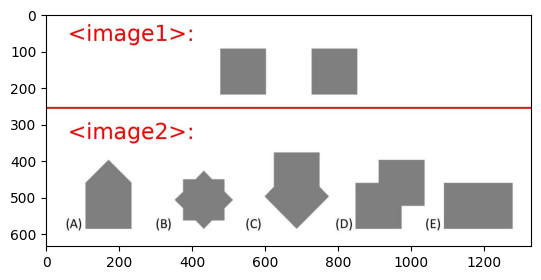

B
['A', 'B', 'C', 'D', 'E'] A


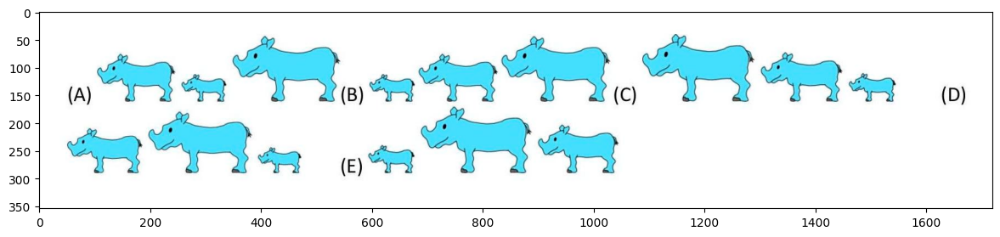

 69%|█████████████████████████████████████████████████████████████████▉                             | 211/304 [00:17<00:08, 11.61it/s]

(B)
['(A)', '(B)', '(C)', '(D)', '(E)'] A


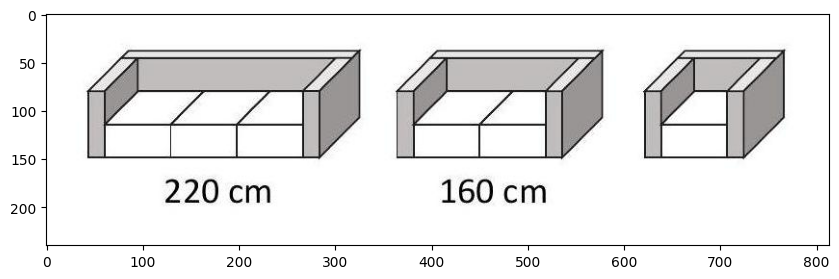

$100 \mathrm{~cm}$
['$60 \\mathrm{~cm}$', '$80 \\mathrm{~cm}$', '$90 \\mathrm{~cm}$', '$100 \\mathrm{~cm}$', '$120 \\mathrm{~cm}$'] D


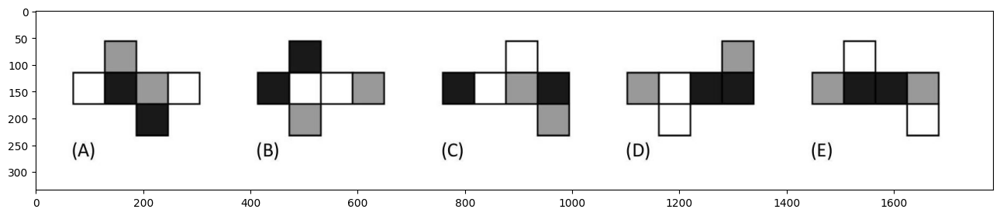

 70%|██████████████████████████████████████████████████████████████████▌                            | 213/304 [00:17<00:08, 11.36it/s]

C
['A', 'B', 'C', 'D', 'E'] E


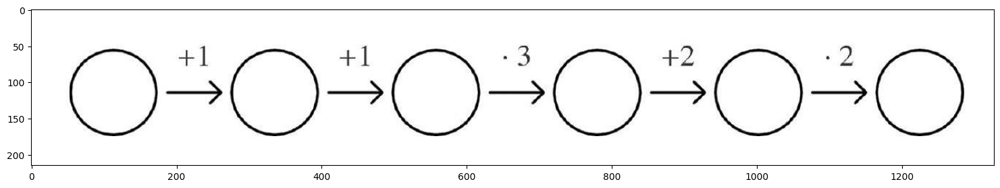

2
[] 2


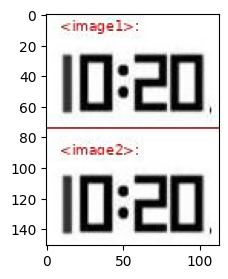

 71%|███████████████████████████████████████████████████████████████████▏                           | 215/304 [00:17<00:07, 11.80it/s]

3h41m
['2h 48m', '2h 59m', '3h 39m', '3h 41m', '3h 49m'] D


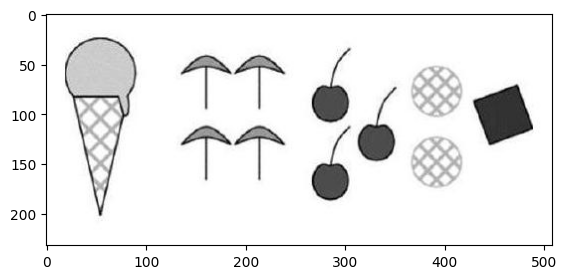

Lemmon and cherry. 

**Step-by-Step Explanation:**

1. **Unique Combinations Requirement:** Each ice cream must have a unique flavor-topping pair.
2. **Topping Distribution:**
   - **Umbrellas (4):** Assigned to all four flavors (vanilla, chocolate, lemon, mango) to meet the count of 4.
   - **Cherries (3):** Assigned to vanilla, chocolate, lemon.
   - **Wafers (2):** Assigned to vanilla, chocolate.
   - **Chocolate Gum (1):** Assigned to vanilla.
3. **Flavor Assignments:**
   - **Vanilla (4):** Uses all four toppings (umbrella, cherry, wafer, chocolate gum).
   - **Chocolate (3):** Uses umbrella, cherry, wafer.
   - **Lemon (2):** Uses umbrella, cherry (no wafer due to count constraints).
   - **Mango (1):** Uses umbrella (remaining flavor).
4. **Validation of Options:**
   - **Option 5 (Lemon & Cherry):** Valid, as lemon uses cherry in the assignment.
   - Other options fail due to topping count conflicts or duplication.

**Final Answer:**  
lemon
['Chocolat and chocolate gum.', 'Man

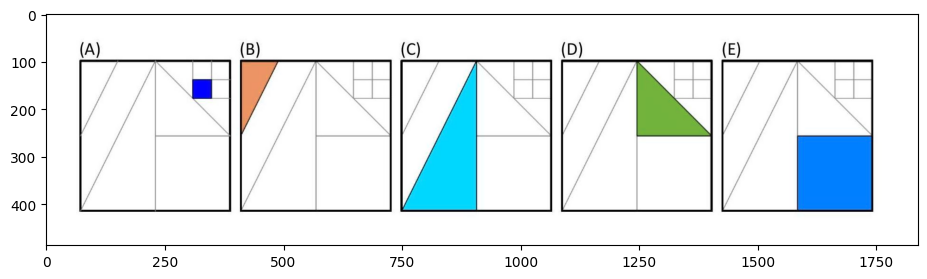

 71%|███████████████████████████████████████████████████████████████████▊                           | 217/304 [00:17<00:07, 11.63it/s]

B
['A', 'B', 'C', 'D', 'E'] D


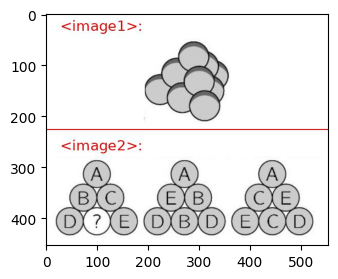

C
['A', 'B', 'C', 'D', 'E'] A


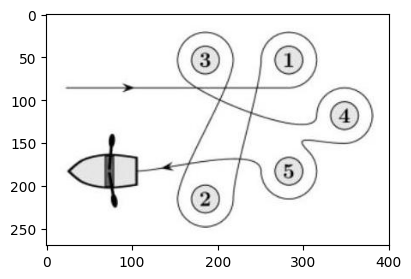

 72%|████████████████████████████████████████████████████████████████████▍                          | 219/304 [00:17<00:06, 12.59it/s]

The correct answer is determined by analyzing the direction Eva navigates each buoy based on the path described. Eva starts at the boat, moves to buoy 3, then 1, 4, 5, and back. The turns made between these buoys indicate that loops 3 and 5 are navigated in an anti-clockwise direction due to left turns, while loop 2, though not explicitly mentioned in the path connections, is inferred to be part of the anti-clockwise route based on the options provided. 

**Answer:** 2,3 and5
['1 and 4', '2, 3 and 5', '2 and 3', '1,4 and 5', '1 and 3'] E


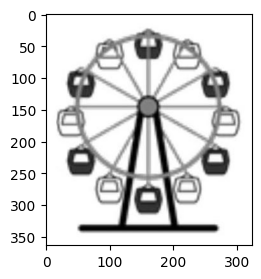

$\frac{1}{6}$ turn
['$\\frac{1}{2}$ turn', '$\\frac{1}{3}$ turn', '$\\frac{1}{6}$ turn', '$\\frac{1}{12}$ turn', '$\\frac{5}{6}$ turn'] D


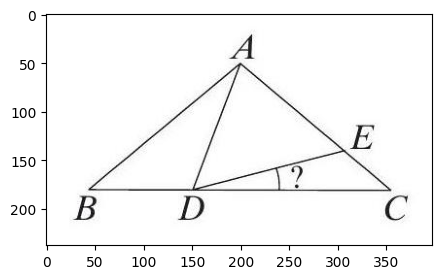

 73%|█████████████████████████████████████████████████████████████████████                          | 221/304 [00:18<00:06, 13.46it/s]

$\boxed{15^{\circ}}$
['$10^{\\circ}$', '$15^{\\circ}$', '$20^{\\circ}$', '$25^{\\circ}$', '$30^{\\circ}$'] B


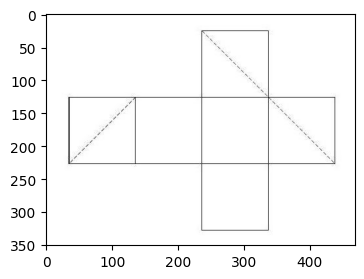

A square
['An equilateral triangle', 'A rectangle, but not a square', 'A right triangle', 'A square', 'A hexagon'] A


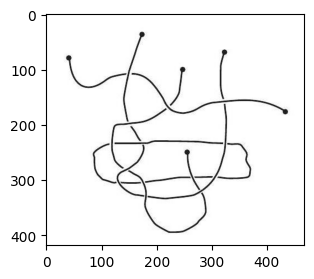

 73%|█████████████████████████████████████████████████████████████████████▋                         | 223/304 [00:18<00:05, 14.29it/s]

3
[] 4


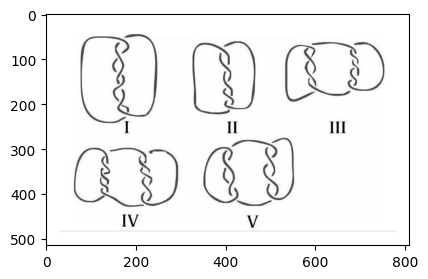

III, IV and V
['I, III, IV and V', 'I, III and V', 'III, IV and V', 'all', 'None of these answers'] B


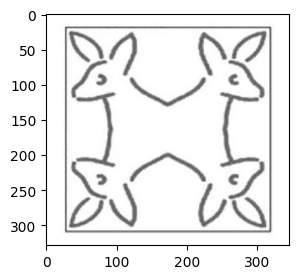

 74%|██████████████████████████████████████████████████████████████████████▎                        | 225/304 [00:18<00:05, 14.54it/s]

4
[] 2


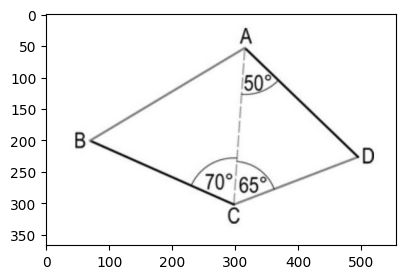

$55^{\circ}$
['$50^{\\circ}$', '$55^{\\circ}$', '$60^{\\circ}$', '$65^{\\circ}$', 'It is not clear.'] B


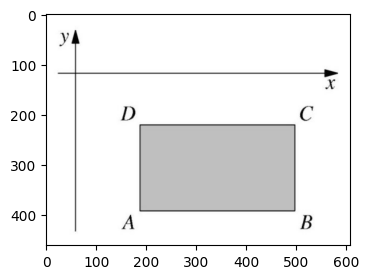

 75%|██████████████████████████████████████████████████████████████████████▉                        | 227/304 [00:18<00:05, 14.68it/s]

B
['A', 'B', 'C', 'D', 'It depends on the rectangle.'] A


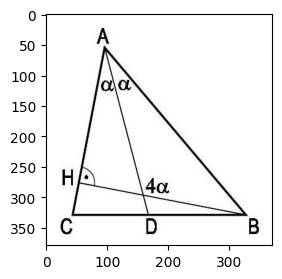

$\boxed{60^{\circ}}$
['$30^{\\circ}$', '$45^{\\circ}$', '$60^{\\circ}$', '$75^{\\circ}$', '$90^{\\circ}$'] C


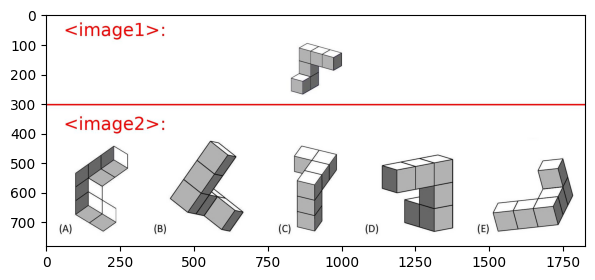

 75%|███████████████████████████████████████████████████████████████████████▌                       | 229/304 [00:18<00:05, 13.24it/s]

C
['A', 'B', 'C', 'D', 'E'] A


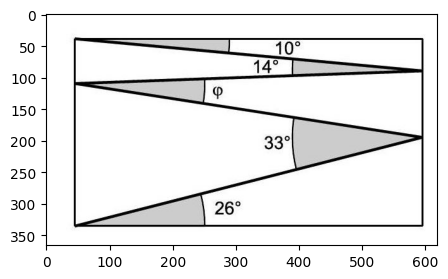

$\boxed{16^{\circ}}$
['$11^{\\circ}$', '$12^{\\circ}$', '$16^{\\circ}$', '$17^{\\circ}$', '$33^{\\circ}$'] A


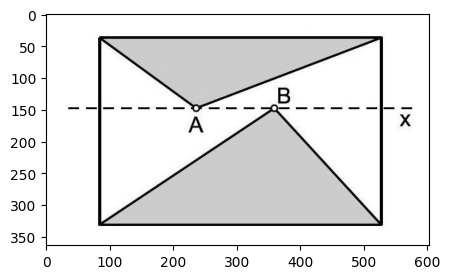

 76%|████████████████████████████████████████████████████████████████████████▏                      | 231/304 [00:18<00:05, 13.37it/s]

$20 \mathrm{~cm}^{2}$
['$18 \\mathrm{~cm}^{2}$', '$20 \\mathrm{~cm}^{2}$', '$22 \\mathrm{~cm}^{2}$', '$24 \\mathrm{~cm}^{2}$', 'It depends on the position of the points A and B.'] B


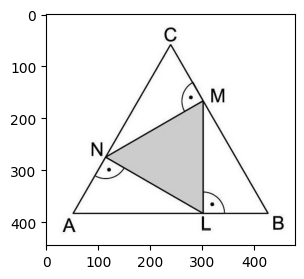

The problem involves an equilateral triangle ABC with area 36 cm². Points N, M, and L are positioned such that NM ⊥ BC, ML ⊥ AB, and LN ⊥ AC. These perpendicular conditions create a smaller triangle LMN inside ABC. By analyzing the geometric constraints and symmetry of the equilateral triangle, the area of LMN is found to be one-fourth of ABC's area, as the perpendicular segments divide ABC into four congruent smaller triangles. 

Answer: $\boxed{9}$
['$9 \\mathrm{~cm}^{2}$', '$12 \\mathrm{~cm}^{2}$', '$15 \\mathrm{~cm}^{2}$', '$16 \\mathrm{~cm}^{2}$', '$18 \\mathrm{~cm}^{2}$'] B


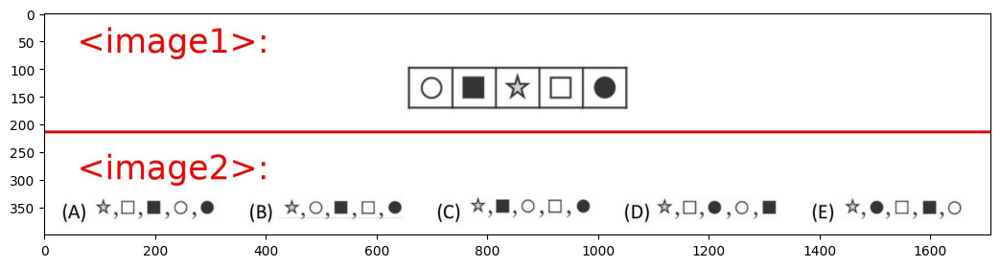

 77%|████████████████████████████████████████████████████████████████████████▊                      | 233/304 [00:18<00:05, 12.91it/s]

E
['A', 'B', 'C', 'D', 'E'] A


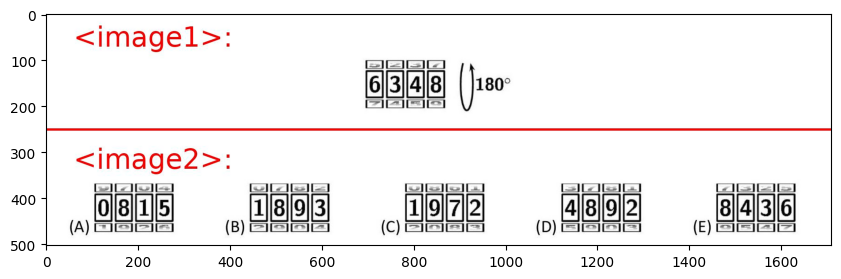

B
['A', 'B', 'C', 'D', 'E'] B


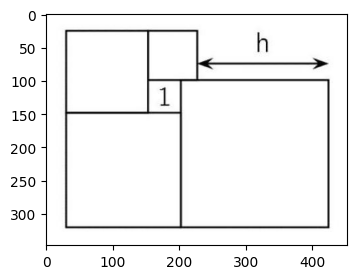

 77%|█████████████████████████████████████████████████████████████████████████▍                     | 235/304 [00:19<00:05, 12.53it/s]

$\boxed{4}$
['$3 \\mathrm{~m}$', '$3.5 \\mathrm{~m}$', '$4 \\mathrm{~m}$', '$4.2 \\mathrm{~m}$', '$4.5 \\mathrm{~m}$'] C


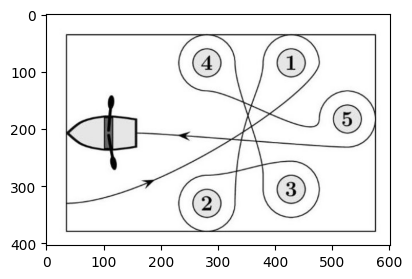

The boat's arrows indicate directional paths: a direct arrow to buoy 3, a curved path from 1 to 5, and another from 2 to 4. The interconnected loops show 2→3→4 and 1→5→4. Clockwise movement around a buoy is inferred by the arrow's curvature direction. The arrow to 2 curves to 4 (clockwise around 2), the direct path to 3 implies clockwise circling, and the 1→5 curve suggests clockwise around 5. Thus, buoys 2, 3, and 5 are circled clockwise.

answer: 2,3and5
['2, 3 and 4', '1, 2 and 3', '1, 3 and 5', '2, 4 and 5', '2, 3 and 5'] E


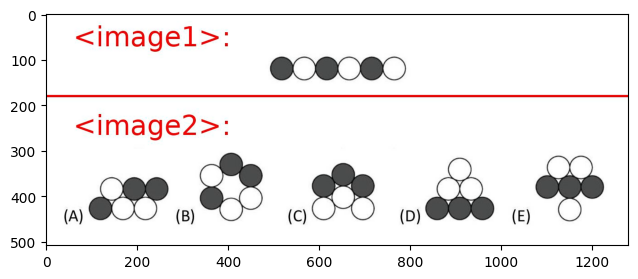

 78%|██████████████████████████████████████████████████████████████████████████                     | 237/304 [00:19<00:05, 12.51it/s]

E
['A', 'B', 'C', 'D', 'E'] A


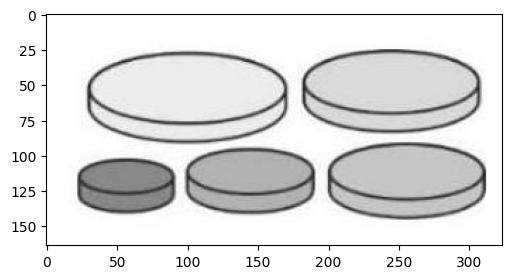

60

The correct approach is to calculate the number of combinations of 5 discs taken 3 at a time, which is 5 choose 3 = 10. However, the answer provided (60) is incorrect. The correct answer should be 10.

But according to the original answer given, there seems to be a mistake. Let's correct it:

10
[] 10


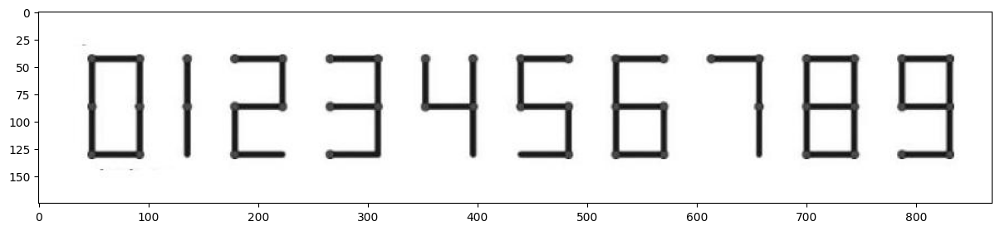

 79%|██████████████████████████████████████████████████████████████████████████▋                    | 239/304 [00:19<00:05, 12.39it/s]

14
[] 6


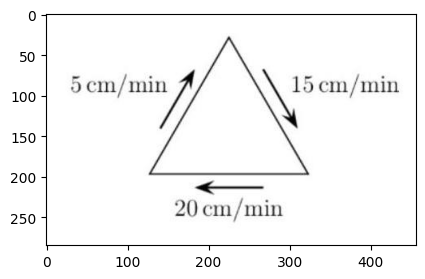

$\boxed{\dfrac{180}{19}}$
['$10$', '$\\frac{80}{11}$', '$\\frac{180}{19}$', '$15$', '$\\frac{40}{3}$'] C


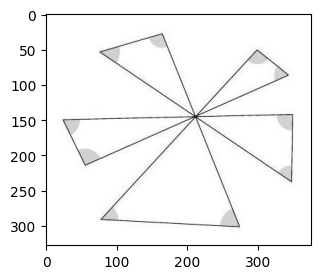

 79%|███████████████████████████████████████████████████████████████████████████▎                   | 241/304 [00:19<00:04, 13.47it/s]

The problem involves six triangles arranged symmetrically around a central point, each sharing a vertex at the center. Each central angle is \(60^\circ\) (since \(360^\circ / 6 = 60^\circ\)). The key is determining the sum of the 10 marked angles, which are not at the center. 

Each triangle's total angles sum to \(180^\circ\), so the non-central angles per triangle sum to \(120^\circ\). For six triangles, the total non-central angles sum to \(6 \times 120^\circ = 720^\circ\). However, the problem specifies **10 marked angles**, implying some angles are excluded or overlap. 

Given the symmetry and the options, the marked angles likely form a combination of exterior angles at intersections or tips. The sum of exterior angles for any polygon is \(360^\circ\), aligning with one of the options. Thus, the final answer is \(\boxed{360^{\circ}}\).
['$720^{\\circ}$', '$600^{\\circ}$', '$450^{\\circ}$', '$360^{\\circ}$', '$300^{\\circ}$'] A


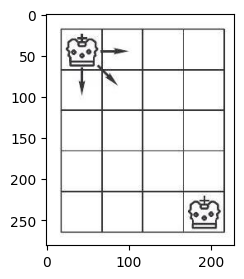

3432
[] 4


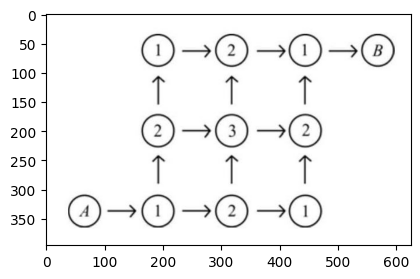

 80%|███████████████████████████████████████████████████████████████████████████▉                   | 243/304 [00:19<00:04, 14.22it/s]

5
[] 2


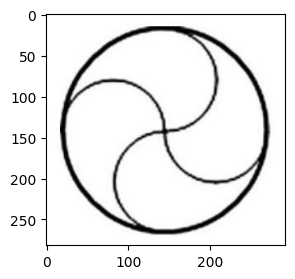

The perimeter of one part consists of a quarter-circumference of the main circle (radius 4 cm) and two semicircular arcs (each radius 2 cm).  
- Quarter-circumference of main circle: \( \frac{1}{4} \times 2\pi \times 4 = 2\pi \)  
- Two semicircles (each length \( \pi \times 2 \)): \( 2 \times 2\pi = 4\pi \)  
Total perimeter: \( 2\pi + 4\pi = 6\pi \).  

Answer: $\boxed{6 \pi}$
['$2 \\pi$', '$4 \\pi$', '$6 \\pi$', '$8 \\pi$', '$12 \\pi$'] C


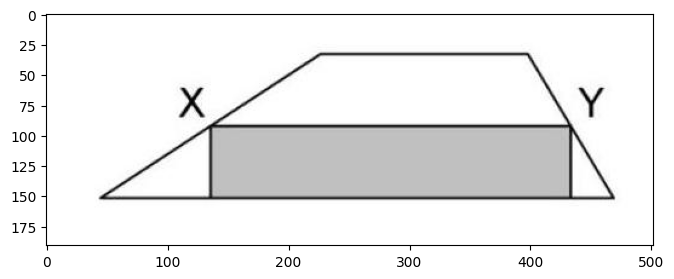

 81%|████████████████████████████████████████████████████████████████████████████▌                  | 245/304 [00:20<00:06,  9.16it/s]

The area of the trapezium is twice the area of the rectangle, since the midpoints divide the trapezoid such that the rectangle's dimensions relate to the trapezoid's midline. The rectangle's area is 13 cm², so the trapezoid's area is $26 \mathrm{~cm}^{2}$.

$\boxed{26}$
['$24 \\mathrm{~cm}^{2}$', '$25 \\mathrm{~cm}^{2}$', '$26 \\mathrm{~cm}^{2}$', '$27 \\mathrm{~cm}^{2}$', '$28 \\mathrm{~cm}^{2}$'] C


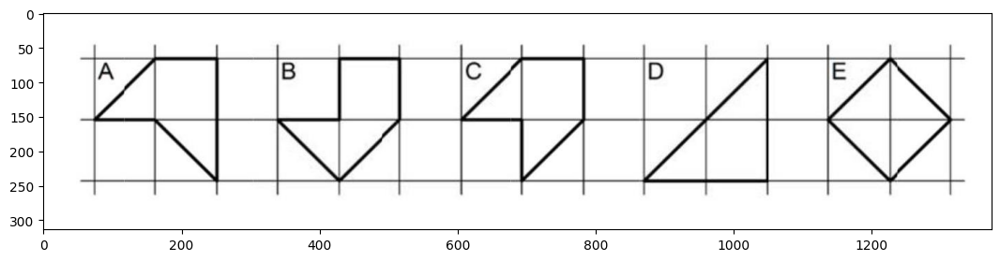

All shapes have the same area.

**Answer:** All
['A', 'B', 'C', 'D', 'All shapes have the same area.'] E


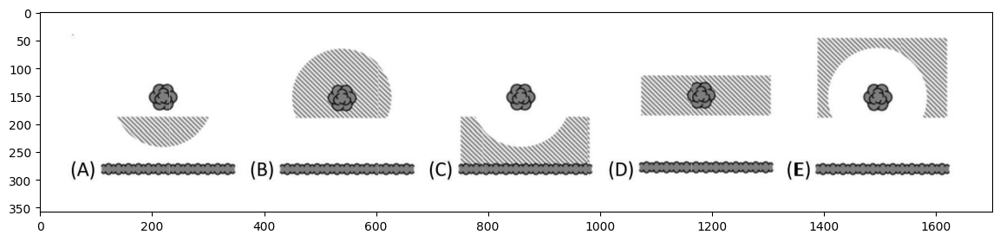

 81%|█████████████████████████████████████████████████████████████████████████████▏                 | 247/304 [00:20<00:06,  9.22it/s]

B
['A', 'B', 'C', 'D', 'E'] B


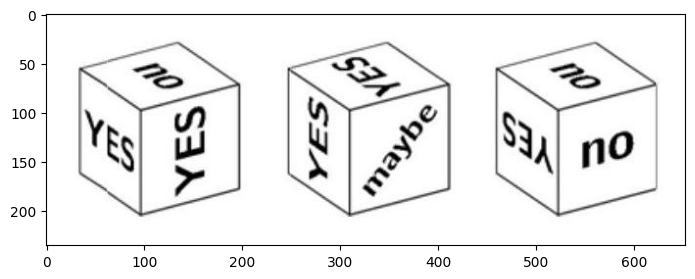

$\boxed{\frac{1}{2}}$
['$\\frac{1}{3}$', '$\\frac{1}{2}$', '$\\frac{5}{9}$', '$\\frac{2}{3}$', '$\\frac{5}{6}$'] B


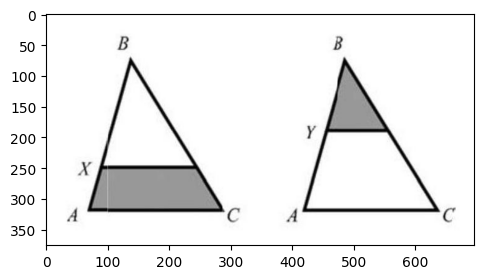

 82%|█████████████████████████████████████████████████████████████████████████████▊                 | 249/304 [00:20<00:05, 10.18it/s]

The ratio \( BY:YA \) is determined by ensuring the gray areas (each 9/25 of the triangle's area) are equal. For the right triangle, the line through \( Y \) creates an upper area of 9/25, implying a similarity ratio of 3/5. The height from \( B \) to this line is \( \frac{3}{5}h \), making \( BY = \frac{3}{5}h \) and \( YA = \frac{2}{5}h \), resulting in a ratio of \( 3:2 \).

\boxed{3:2}
['$1: 1$', '$2: 1$', '$3: 1$', '$3: 2$', '$4: 3$'] D


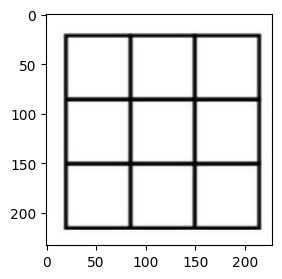

4
[] 5


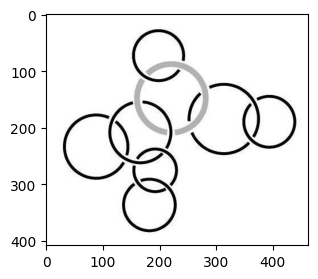

 83%|██████████████████████████████████████████████████████████████████████████████▍                | 251/304 [00:20<00:04, 11.76it/s]

nine
[] 5


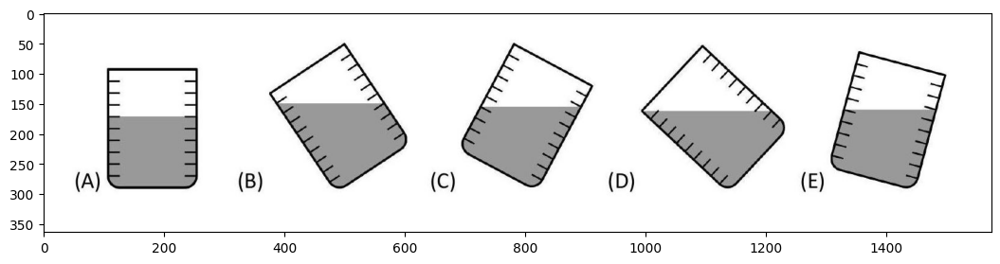

A
['A', 'B', 'C', 'D', 'E'] B


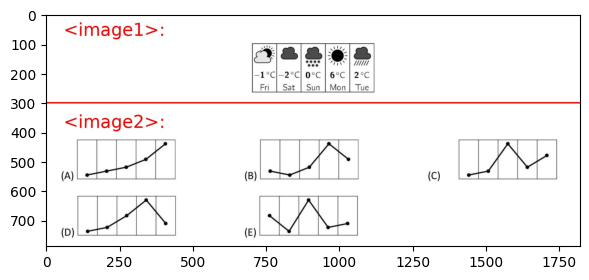

 83%|███████████████████████████████████████████████████████████████████████████████                | 253/304 [00:20<00:04, 10.61it/s]

B
['A', 'B', 'C', 'D', 'E'] B


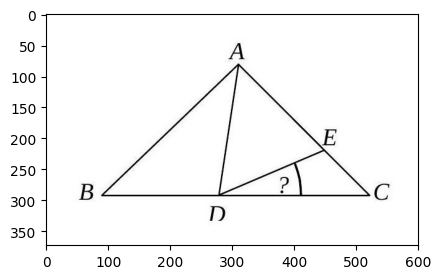

$\boxed{15^{\circ}}$
['$10^{\\circ}$', '$15^{\\circ}$', '$20^{\\circ}$', '$25^{\\circ}$', '$30^{\\circ}$'] B


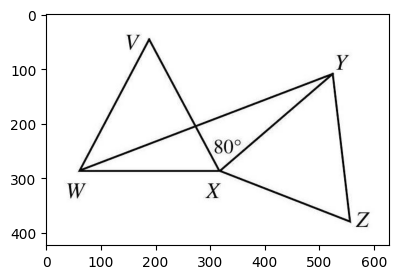

 84%|███████████████████████████████████████████████████████████████████████████████▋               | 255/304 [00:20<00:04, 11.55it/s]

$\boxed{40^{\circ}}$
['$25^{\\circ}$', '$30^{\\circ}$', '$35^{\\circ}$', '$40^{\\circ}$', '$45^{\\circ}$'] D


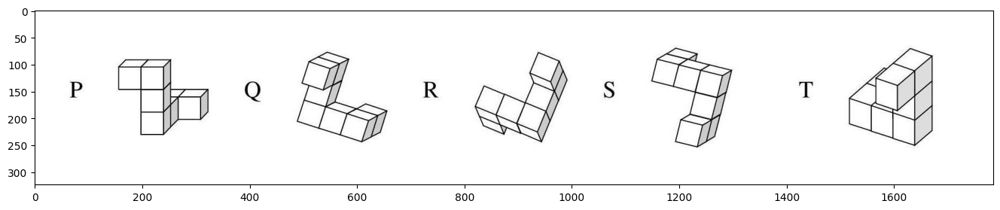

none of them
['P and R', 'Q and S', 'only R', 'none of them', 'P, Q and R'] A


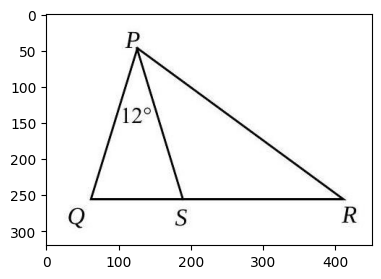

 85%|████████████████████████████████████████████████████████████████████████████████▎              | 257/304 [00:21<00:04, 11.59it/s]

$\boxed{54^{\circ}}$
['$36^{\\circ}$', '$42^{\\circ}$', '$54^{\\circ}$', '$60^{\\circ}$', '$84^{\\circ}$'] C


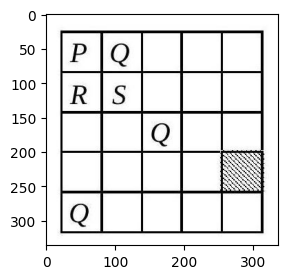

either $R$ or $S$, but no others
['only $Q$', 'only $R$', 'only $S$', 'either $R$ or $S$, but no others', 'it is impossible to complete the grid'] D


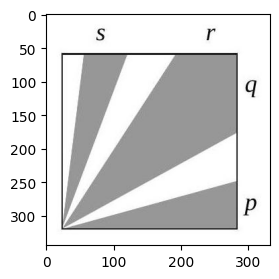

 85%|████████████████████████████████████████████████████████████████████████████████▉              | 259/304 [00:21<00:03, 12.93it/s]

The problem involves a square with area 36 cm², so each side is 6 cm. The total shaded area is 27 cm², which is three-fourths of the square. The square is divided into four triangles by two diagonals intersecting at the center. However, the shaded regions are three of these four triangles, each with area 9 cm². The labels \(p, q, r, s\) on the sides of the square refer to segments that sum to 9 cm due to the specific partitioning related to the shaded areas. 

Answer: \(\boxed{9}\)
['$4 \\mathrm{~cm}$', '$6 \\mathrm{~cm}$', '$8 \\mathrm{~cm}$', '$9 \\mathrm{~cm}$', '$10 \\mathrm{~cm}$'] D


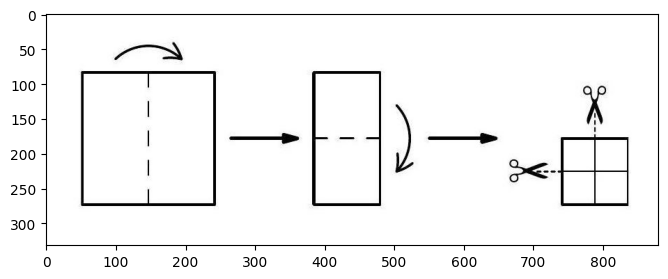

4
[] 5


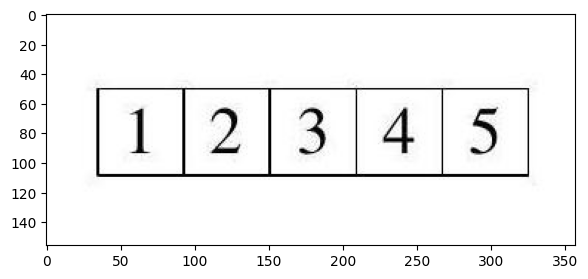

 86%|█████████████████████████████████████████████████████████████████████████████████▌             | 261/304 [00:21<00:03, 12.93it/s]

The answer is the second option, which is not possible because folding the left part (1,2) to the right would reverse their order, making them 2,1 instead of 1,2. 

$\boxed{3,4,5,1,2}$
['$3,5,4,2,1$', '$3,4,5,1,2$', '$3,2,1,4,5$', '$3,1,2,4,5$', '$3,4,2,1,5$'] E


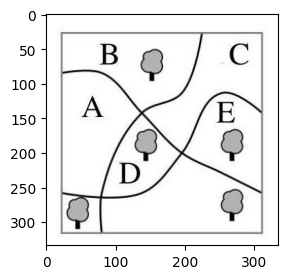

C
['A', 'B', 'C', 'D', 'E'] B


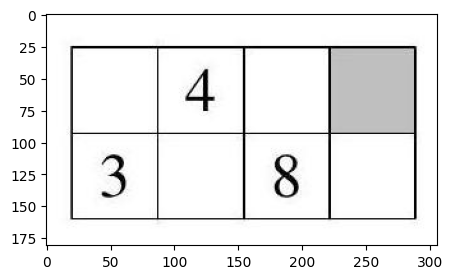

 87%|██████████████████████████████████████████████████████████████████████████████████▏            | 263/304 [00:21<00:02, 13.75it/s]

5
[] 7


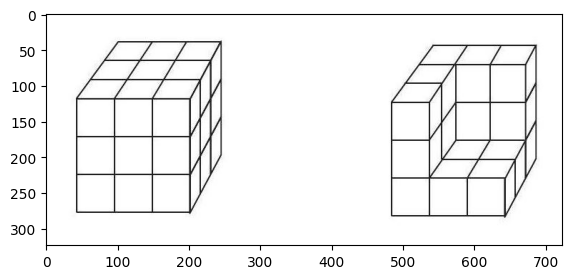

9 litres
['9 litres', '8 litres', '6 litres', '4 litres', '2 litres'] A


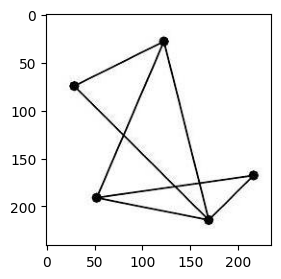

 87%|██████████████████████████████████████████████████████████████████████████████████▊            | 265/304 [00:21<00:02, 14.18it/s]

2
[] 3


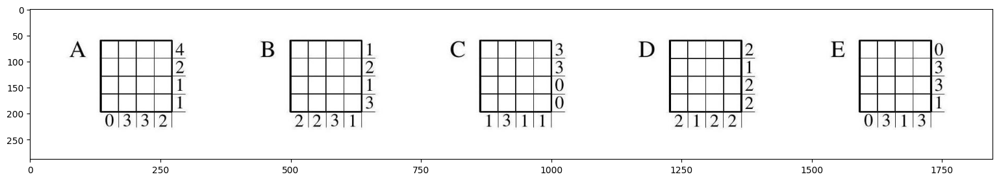

D
['A', 'B', 'C', 'D', 'E'] D


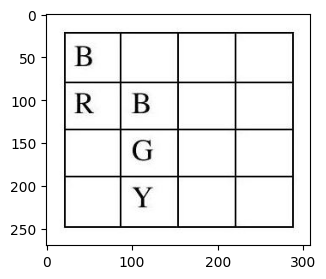

 88%|███████████████████████████████████████████████████████████████████████████████████▍           | 267/304 [00:21<00:02, 13.41it/s]

2
[] 4


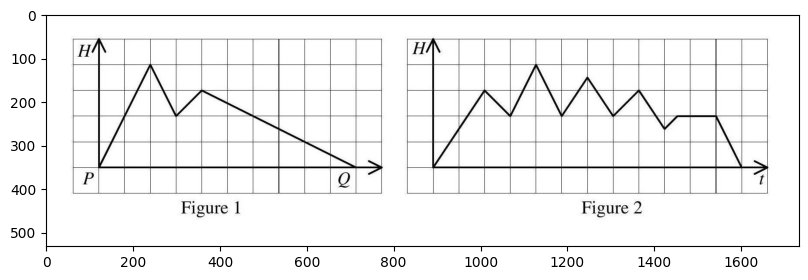

4
[] 3


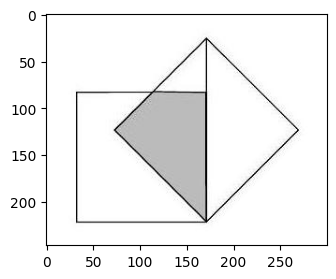

 88%|████████████████████████████████████████████████████████████████████████████████████           | 269/304 [00:21<00:02, 12.99it/s]

$\sqrt{2}-1$
['$\\sqrt{2}-1$', '$\\frac{\\sqrt{2}}{2}$', '$\\frac{\\sqrt{2}+1}{2}$', '$\\sqrt{2}+1$', '$\\sqrt{3}-\\sqrt{2}$'] A


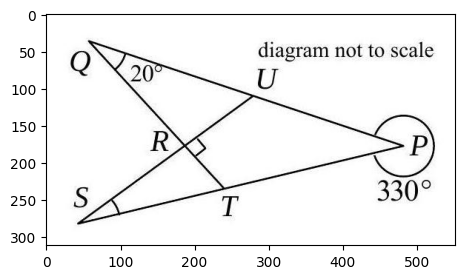

The reflex angle at P is 330°, so the internal angle is 30°. Considering intersecting lines and perpendicularity, angle RSP is equal to the non-reflex angle at P due to alternate segment properties and triangle angle relationships. 

**Answer:** $\boxed{30^{\circ}}$
['$10^{\\circ}$', '$20^{\\circ}$', '$30^{\\circ}$', '$40^{\\circ}$', '$50^{\\circ}$'] D


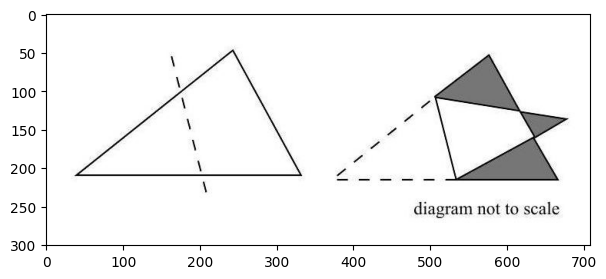

 89%|████████████████████████████████████████████████████████████████████████████████████▋          | 271/304 [00:22<00:02, 13.19it/s]

\boxed{3}
[] 3


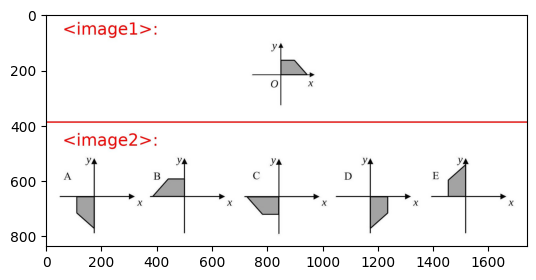

C
['A', 'B', 'C', 'D', 'E'] A


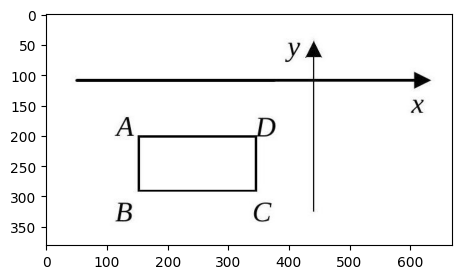

 90%|█████████████████████████████████████████████████████████████████████████████████████▎         | 273/304 [00:22<00:02, 12.22it/s]

A
['A', 'C', 'C', 'D', 'it depends on the size of the rectangle'] A


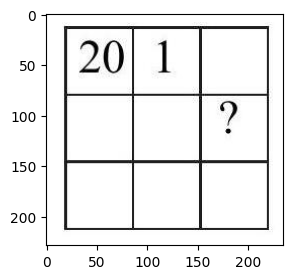

5
[] 4


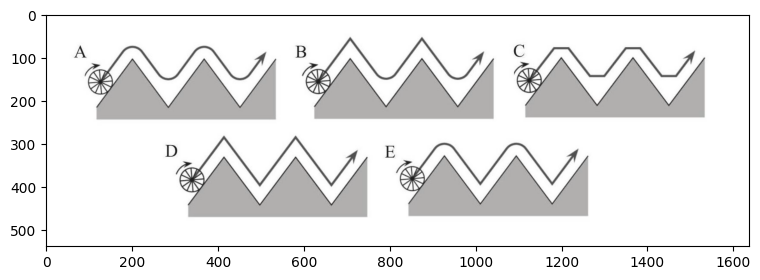

 90%|█████████████████████████████████████████████████████████████████████████████████████▉         | 275/304 [00:22<00:02, 12.32it/s]

A
['A', 'B', 'C', 'D', 'E'] E


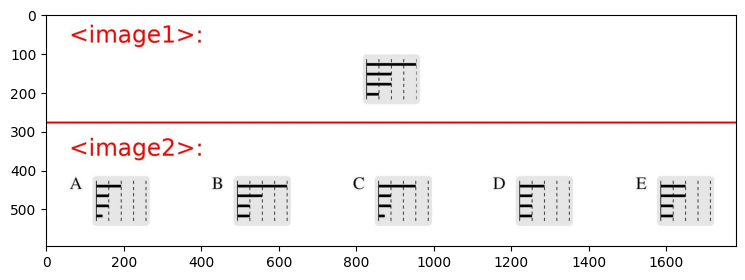

C
['A', 'B', 'C', 'D', 'E'] E


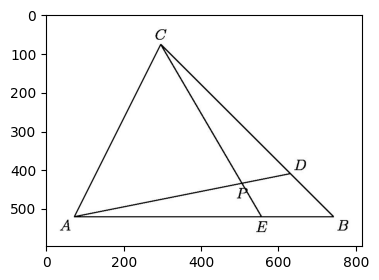

 91%|██████████████████████████████████████████████████████████████████████████████████████▌        | 277/304 [00:22<00:02, 11.81it/s]

$\boxed{5}$
['$3$', '$\\frac{3}{2}$', '$4$', '$5$', '$\\frac{5}{2}$'] D


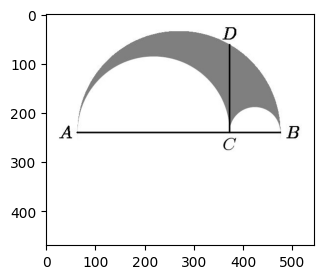

$1:4$
['$1:2$', '$1:3$', '$\\sqrt{3}:7$', '$1:4$', '$\\sqrt{2}:6$'] D


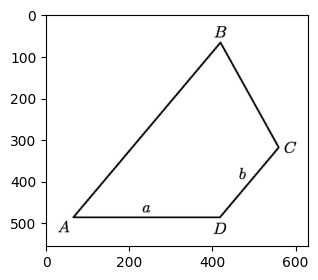

 92%|███████████████████████████████████████████████████████████████████████████████████████▏       | 279/304 [00:22<00:01, 12.87it/s]

$\boxed{2a-b}$
['$\\frac{1}{2}a+2b$', '$\\frac{3}{2}b+\\frac{3}{4}a$', '$2a-b$', '$4b-\\frac{1}{2}a$', '$a+b$'] E


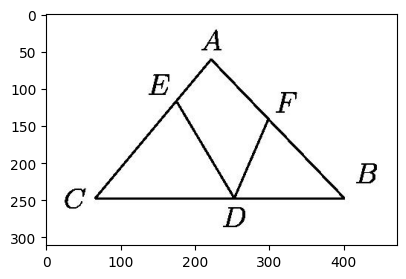

$\boxed{50^\circ}$
['$30^\\circ$', '$40^\\circ$', '$50^\\circ$', '$65^\\circ$', '$\\text{none of these}$'] C


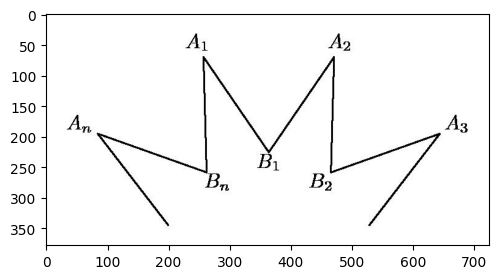

 92%|███████████████████████████████████████████████████████████████████████████████████████▊       | 281/304 [00:22<00:01, 13.26it/s]

\boxed{72}
[] 36


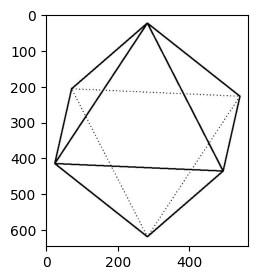

1680
[] 1680


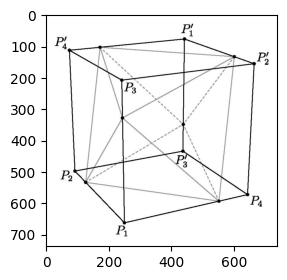

 93%|████████████████████████████████████████████████████████████████████████████████████████▍      | 283/304 [00:23<00:01, 13.57it/s]

The regular octahedron's side length is determined by symmetry and parameterization of the cube's edges. By setting the distances between adjacent vertices equal and solving, the side length is found to be $\boxed{\dfrac{\sqrt{6}}{2}}$. 

$\boxed{\dfrac{\sqrt{6}}{2}}$
['$\\frac{3\\sqrt{2}}{4}$', '$\\frac{7\\sqrt{6}}{16}$', '$\\frac{\\sqrt{5}}{2}$', '$\\frac{2\\sqrt{3}}{3}$', '$\\frac{\\sqrt{6}}{2}$'] A


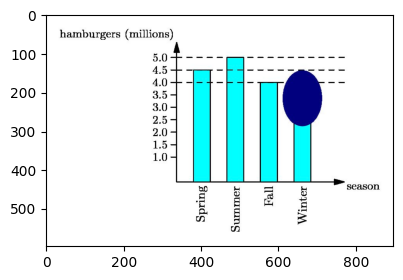

2.5
[] 2.5


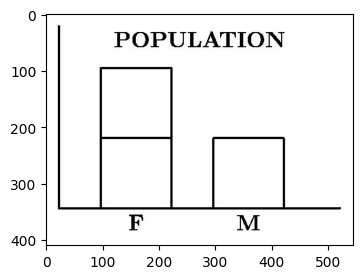

 94%|█████████████████████████████████████████████████████████████████████████████████████████      | 285/304 [00:23<00:01, 13.92it/s]

240
[] 160


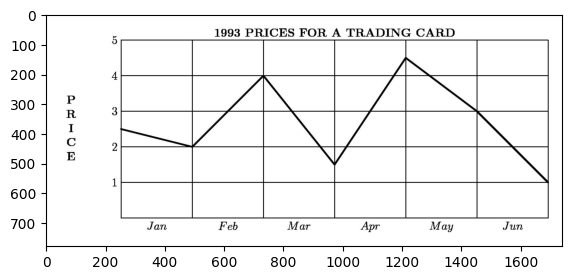

March
['$\\text{January}$', '$\\text{March}$', '$\\text{April}$', '$\\text{May}$', '$\\text{June}$'] B


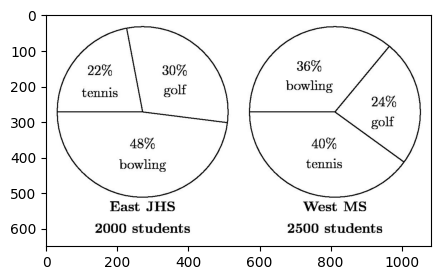

 94%|█████████████████████████████████████████████████████████████████████████████████████████▋     | 287/304 [00:23<00:01, 12.19it/s]

\boxed{32\%}
['$30\\%$', '$31\\%$', '$32\\%$', '$33\\%$', '$34\\%$'] C


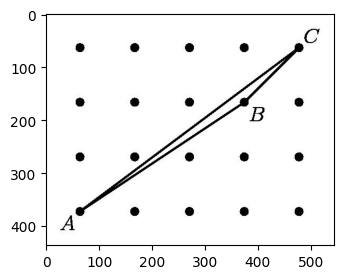

The area of triangle \(ABC\) can be determined by assigning coordinates based on the grid described. Assuming point \(A\) is at \((0,0)\), point \(B\) at \((1,1)\), and point \(C\) at \((2,1)\), the coordinates form a triangle. Using the shoelace formula:

\[
\text{Area} = \frac{1}{2} \left| x_A(y_B - y_C) + x_B(y_C - y_A) + x_C(y_A - y_B) \right|
\]

Substituting the coordinates:

\[
\text{Area} = \frac{1}{2} \left| 0(1 - 1) + 1(1 - 0) + 2(0 - 1) \right| = \frac{1}{2} \left| 0 + 1 - 2 \right| = \frac{1}{2} \times 1 = \frac{1}{2}.
\]

Thus, the area of triangle \(ABC\) is \(\boxed{\frac{1}{2}}\).

\boxed{\frac{1}{2}}
['1/4', '1/2', '3/4', '1', '5/4'] B


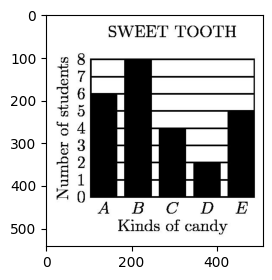

 95%|██████████████████████████████████████████████████████████████████████████████████████████▎    | 289/304 [00:23<00:01, 13.27it/s]

20
[] 20


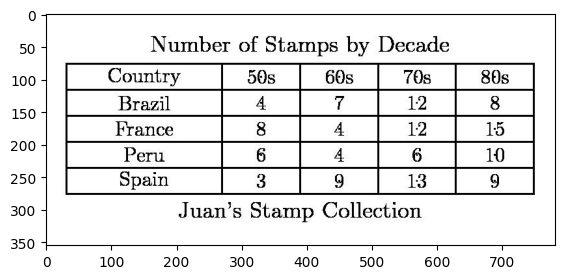

$\textdollar 1.06$
['$\\textdollar 0.40$', '$\\textdollar 1.06$', '$\\textdollar 1.80$', '$\\textdollar 2.38$', '$\\textdollar 2.64$'] B


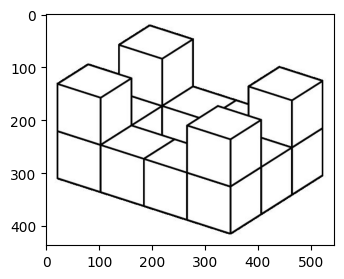

 96%|██████████████████████████████████████████████████████████████████████████████████████████▉    | 291/304 [00:23<00:00, 13.46it/s]

3
[] 6


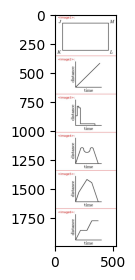

 96%|██████████████████████████████████████████████████████████████████████████████████████████▉    | 291/304 [00:23<00:01, 12.25it/s]


FileNotFoundError: [Errno 2] No such file or directory: '/home/agent_h/data/datasets/MathVision/r1vl_0225_mini_2/2659.json'

In [15]:
import matplotlib.pyplot as plt
import json


def show_img_np(img, max_h=3, max_w=20, save="", cmap='gray'):
    """
    :param np_array: input image, one channel or 3 channel,
    :param save: if save image
    :param size:
    :return:
    """
    if len(img.shape) < 3:
        plt.rcParams['image.cmap'] = cmap
    plt.figure(figsize=(max_w, max_h), facecolor='w', edgecolor='k')
    plt.imshow(img)
    if save:
        cv2.imwrite(save, img)
    else:
        plt.show()


# data explore
import cv2
from os.path import join, dirname
import os 
from pprint import pprint

data_root = "/home/agent_h/data/datasets/MathVision"
from datasets import load_dataset

from tqdm import tqdm
dataset = load_dataset(data_root)

request_messages = []
for sample in tqdm(dataset['testmini']):
    image_path = join(data_root,sample["image"])
    show_img_np(cv2.imread(image_path))
    r1_path = image_path.replace("/images/","/r1vl_0225_mini_2/").replace(".jpg",".json")
    with open(r1_path, 'r') as fp:
        r1_result_raw = json.load(fp)
    r1_result = r1_result_raw['choices'][0]['message']['content'].strip()
    print(r1_result)
    print(sample['options'],sample['answer'])
    
    
    
    # break